# Importing packages

In [ ]:
import wrds
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.precision', 4)
pd.set_option('display.max_rows', 10)

import statsmodels.api as sm
from scipy.stats.mstats import winsorize

import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [20, 5]
sns.set(font_scale=1.5)
# matplotlib style
sns.set_style("white")

from sklearn.preprocessing import QuantileTransformer
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor, LinearRegression
from sklearn.svm import LinearSVR, SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, make_scorer
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GroupKFold, cross_val_score
from tqdm import tqdm

from fredapi import Fred
import wbdata
import faostat

import copy

# Defining functions: Adj R2, Bias & Accuracy

In [ ]:
def adj_r2_func(y_true, y_pred, n, p):
    r2 = r2_score(y_true, y_pred)
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)
    return adj_r2

adj_r2_error = make_scorer(adj_r2_func)

def bias_func(y_true, y_pred, denominator=1):
    return (y_true / denominator - y_pred / denominator).median()

bias_error = make_scorer(bias_func)

def accuracy_func(y_true, y_pred, denominator=1):
    return (y_true / denominator - y_pred / denominator).abs().median()

accuracy_error = make_scorer(accuracy_func)

# Connect db

In [ ]:
db = wrds.Connection(wrds_username='rx96')

Loading library list...
Done


# Get data

### Compustat fundamentals
https://wrds-www.wharton.upenn.edu/pages/get-data/compustat-capital-iq-standard-poors/compustat/north-america-daily/fundamentals-annual/

In [ ]:
db.describe_table(library='comp', table='funda').name.values

Approximately 873808 rows in comp.funda.


array(['gvkey', 'datadate', 'fyear', 'indfmt', 'consol', 'popsrc',
       'datafmt', 'tic', 'cusip', 'conm', 'acctchg', 'acctstd', 'acqmeth',
       'adrr', 'ajex', 'ajp', 'bspr', 'compst', 'curcd', 'curncd',
       'currtr', 'curuscn', 'final', 'fyr', 'ismod', 'ltcm', 'ogm',
       'pddur', 'scf', 'src', 'stalt', 'udpl', 'upd', 'apdedate', 'fdate',
       'pdate', 'acchg', 'acco', 'accrt', 'acdo', 'aco', 'acodo',
       'acominc', 'acox', 'acoxar', 'acqao', 'acqcshi', 'acqgdwl',
       'acqic', 'acqintan', 'acqinvt', 'acqlntal', 'acqniintc', 'acqppe',
       'acqsc', 'act', 'adpac', 'aedi', 'afudcc', 'afudci', 'aldo', 'am',
       'amc', 'amdc', 'amgw', 'ano', 'ao', 'aocidergl', 'aociother',
       'aocipen', 'aocisecgl', 'aodo', 'aol2', 'aoloch', 'aox', 'ap',
       'apalch', 'apb', 'apc', 'apofs', 'aqa', 'aqc', 'aqd', 'aqeps',
       'aqi', 'aqp', 'aqpl1', 'aqs', 'arb', 'arc', 'arce', 'arced',
       'arceeps', 'artfs', 'at', 'aul3', 'autxr', 'balr', 'banlr', 'bast',
       'bastr',

### Train test split
- Reference: https://link.springer.com/article/10.1007/s11142-014-9282-y
- $E_{i,t+1 = 2020}  = X_{i,t = 2019}$
  - no look-ahead bias: trains with data during 2009 and 2018 (10 years)
  - out-of-sample prediction of 2020 earnings using 2019 data
- $E_{i,t+2 = 2021}  = X_{i,t = 2019}$
  - no look-ahead bias: trains with data during 2009 and 2018 (10 years)
  - out-of-sample prediction of 2021 earnings using 2019 data
- $E_{i,t+3 = 2022}  = X_{i,t = 2019}$
  - no look-ahead bias: trains with data during 2009 and 2018 (10 years)
  - out-of-sample prediction of 2022 earnings using 2019 data
- Scaled output and input variables for HVZ, EP and RI with common shares outstanding as of June end (cshom)

### HVZ

$ {E_{i,t+\tau}} = \alpha_0 + \alpha_1A_{i,t} + \alpha_2D_{i,t} + \alpha_3DD_{i,t} + \alpha_4E_{i,t} + \alpha_5NegE_{i,t} + \alpha_6AC_{i,t} + \epsilon_{i,t+\tau}$

where $A$ = total assets, $D$ = dividend payments, $DD$ = dummy for paying dividends, $E$ = earnings, $NegE$ = dummy for negative earnings, $AC$ = total accruals,

$AC_{it}$ = $\Delta $(current\_assets - cash) - $\Delta$(current\_liabilities  - short\_term\_debt - taxes payable) - depreciation

In [ ]:
hvz = db.raw_sql(
  """
  WITH 
  computstat_table AS ( --create computstat_table subquery for fundamentals data during 2010 and 2022
    SELECT 
      gvkey, cik, conm, tic, fyear, datadate,
      --csho, --common_shares_outstanding
      ib, --net_income_before_extra_items
      spi, --special_items
      epspx, --eps_basic
      LEAD(ib,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead1, 
      LEAD(ib,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead2, 
      LEAD(ib,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead3, 
      LEAD(spi,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead1,
      LEAD(spi,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead2,
      LEAD(spi,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead3,
      at, --total_assets
      dvc, --common dividend
      CASE WHEN dvc > 0 THEN 1 ELSE 0 END AS dd, --indicator variable for common dividend
      ib - spi AS earnings, --earnings
      CASE WHEN (ib - spi) < 0 THEN 1 ELSE 0 END AS neg_earnings, --indicator variable for negative earnings
      CASE WHEN act IS NULL THEN 0 ELSE act END AS act, --current_assets
      CASE WHEN lct IS NULL THEN 0 ELSE lct END AS lct, --current_liabilities
      CASE WHEN che IS NULL THEN 0 ELSE che END AS che, --cash_ST
      CASE WHEN dlc IS NULL THEN 0 ELSE dlc END AS dlc, --current_debt
      CASE WHEN txp IS NULL THEN 0 ELSE txp END AS txp, --income_tax_payable
      CASE WHEN dp IS NULL THEN 0 ELSE dp END AS dp, --depreciation
      CASE WHEN LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS act_lag1, --current_assets lag 1
      CASE WHEN LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS che_lag1, --cash_ST lag 1
      CASE WHEN LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS lct_lag1, --current_liabilities lag 1
      CASE WHEN LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS dlc_lag1, --current_debt lag 1
      CASE WHEN LAG(txp, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(txp, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS txp_lag1 --income_tax_payable lag 1       
    FROM comp.funda
    WHERE 
      fyear >= 2008 -- start in 2008 so lagged variables are available for 2009
      AND 
      fyear <= 2022
      --AND
      --act IS NOT NULL
      AND
      indfmt = 'INDL' AND datafmt = 'STD' AND popsrc = 'D' AND consol = 'C' --filters from Quercus
      --AND
      --gvkey IN ('001690')
      
  ),
  industry_table AS ( -- create industry_table subquery to include sic of all firms except financial firms (SIC 4400-5000) and (SIC 6000-6500)
    SELECT 
      gvkey, sic
    FROM comp.company
    WHERE 
      NOT(sic >= '4400' AND sic <= '5000')
      AND
      NOT(sic >= '6000' AND sic <= '6500')
  ),
  cshom_table AS ( -- create cshom_table subquery to include common shares outstanding
    SELECT
        gvkey, tic, cyear, cshom / 1000000 AS cshom, prccm
    FROM comp.secm
    WHERE 
        cyear >= 2009
        AND 
        cyear <= 2022
        AND
        cmth = 6 -- only include June month-end data
        AND
        cshom > 0 AND prccm > 0
        
  )
  
  SELECT 
    computstat_table.gvkey, computstat_table.cik, computstat_table.conm, computstat_table.tic, computstat_table.fyear, computstat_table.datadate, 
    --industry_table.sic, LEFT(industry_table.sic, 2) AS sic_group, --industry_table.sic2
    cshom_table.cshom,
    cshom_table.prccm,
    cshom_table.cshom * cshom_table.prccm AS market_cap,
    (ib_lead1 - spi_lead1) AS earnings_lead1, --earnings_lead1
    (ib_lead2 - spi_lead2) AS earnings_lead2, --earnings_lead2
    (ib_lead3 - spi_lead3) AS earnings_lead3, --earnings_lead3
    --epspx,
    1 AS intercept, --intercept
    at AS at, --total_assets
    dvc AS dvc, --common dividend
    dd, --indicator variable for common dividend
    (ib - spi)  AS earnings, --earnings
    neg_earnings, --indicator variable for negative earnings
    ((act - act_lag1) - (lct - lct_lag1) - ((che - che_lag1) - (dlc - dlc_lag1) - (txp - txp_lag1)) - dp) AS total_accruals --total_accruals
  FROM computstat_table
  INNER JOIN cshom_table --inner join cshom_table to computstat_table to include common shares outstanding
  ON 
    computstat_table.gvkey = cshom_table.gvkey
    AND
    computstat_table.tic = cshom_table.tic
    AND
    computstat_table.fyear = cshom_table.cyear
  --INNER JOIN industry_table --inner join industry_table to computstat_table to drop financial firms
  --ON computstat_table.gvkey = industry_table.gvkey
  WHERE fyear >= 2009 AND fyear <= 2022
  ORDER BY gvkey, fyear
  --LIMIT 20
  """) 
hvz

,gvkey,cik,conm,tic,fyear,datadate,cshom,prccm,market_cap,earnings_lead1,earnings_lead2,earnings_lead3,intercept,at,dvc,dd,earnings,neg_earnings,total_accruals
0,001004,0000001750,AAR CORP,AIR,2009.0,2010-05-31,38.697,16.0500,621.086850,74.675,81.587,76.1,1,1501.042,0.000,0,48.930,0,-30.796
1,001004,0000001750,AAR CORP,AIR,2010.0,2011-05-31,39.025,16.7400,653.278500,81.587,76.100,72.9,1,1703.727,2.983,1,74.675,0,-67.284
2,001004,0000001750,AAR CORP,AIR,2011.0,2012-05-31,39.739,27.0900,1076.529510,76.100,72.900,-6.1,1,2195.653,12.081,1,81.587,0,10.241
3,001004,0000001750,AAR CORP,AIR,2012.0,2013-05-31,40.288,13.4800,543.082240,72.900,-6.100,40.9,1,2136.900,11.900,1,76.100,0,-97.991
4,001004,0000001750,AAR CORP,AIR,2013.0,2014-05-31,39.733,21.9800,873.331340,-6.100,40.900,47.6,1,2199.500,11.800,1,72.900,0,-73.900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127139,349972,0001857044,INDAPTUS THERAPEUTICS INC,INDP,2022.0,2022-12-31,8.259,2.6100,21.555990,NaN,NaN,NaN,1,28.064,0.000,0,-14.347,1,0.709
127140,349994,0001892500,CLEARMIND MEDICINE INC,CMND,2022.0,2022-10-31,37.565,0.2771,10.409261,NaN,NaN,NaN,1,1.128,0.000,0,-9.411,1,-2.510
127141,351038,0001671502,CELLECT BIOTECHNOLOGY LTD,QNRX,2022.0,2022-12-31,3354.654,0.4503,1510.600696,NaN,NaN,NaN,1,14.458,0.000,0,-9.797,1,4.569
127142,351491,None,IVECO GROUP N V,IVCGF,2022.0,2022-12-31,271.215,5.2360,1420.081740,NaN,NaN,NaN,1,17113.769,0.000,0,235.123,0,-5974.852


### EP (Earnings Persistence)
$ {E_{i,t+\tau} \over csho_t} = \beta_0 + \beta_1NegE_{i,t} + \beta_2E_{i,t} + \beta_3NegE_{i,t}E_{i,t} + \epsilon_{i,t+\tau}$

where $E$ = earnings, $NegE$ = dummy for negative earnings

In [ ]:
earnings_persistence = db.raw_sql(
  """
  WITH 
  computstat_table AS ( --create computstat_table subquery for fundamentals data during 2010 and 2022
    SELECT 
      gvkey, cik, conm, tic, fyear, datadate,
      ib, --net_income_before_extra_items
      spi, --special_items
      LEAD(ib,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead1, 
      LEAD(ib,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead2, 
      LEAD(ib,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead3, 
      LEAD(spi,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead1,
      LEAD(spi,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead2,
      LEAD(spi,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead3,
      CASE WHEN at IS NULL THEN 0 ELSE at END AS at, --total_assets
      CASE WHEN dvc IS NULL THEN 0 ELSE dvc END AS dvc, --common dividend
      CASE WHEN dvc > 0 THEN 1 ELSE 0 END AS dd, --indicator variable for common dividend
      ib - spi AS earnings, --earnings
      CASE WHEN (ib - spi) < 0 THEN 1 ELSE 0 END AS neg_earnings, --indicator variable for negative earnings
      CASE WHEN act IS NULL THEN 0 ELSE act END AS act, --current_assets
      CASE WHEN lct IS NULL THEN 0 ELSE lct END AS lct, --current_liabilities
      CASE WHEN che IS NULL THEN 0 ELSE che END AS che, --cash_ST
      CASE WHEN dlc IS NULL THEN 0 ELSE dlc END AS dlc, --current_debt
      CASE WHEN txp IS NULL THEN 0 ELSE txp END AS txp, --income_tax_payable
      CASE WHEN dp IS NULL THEN 0 ELSE dp END AS dp, --depreciation
      CASE WHEN LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS act_lag1, --current_assets lag 1
      CASE WHEN LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS che_lag1, --cash_ST lag 1
      CASE WHEN LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS lct_lag1, --current_liabilities lag 1
      CASE WHEN LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS dlc_lag1, --current_debt lag 1
      CASE WHEN LAG(txp, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(txp, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS txp_lag1 --income_tax_payable lag 1
    FROM comp.funda
    WHERE 
      fyear >= 2008 -- start in 2008 so lagged variables are available for 2009
      AND 
      fyear <= 2022
      --AND
      --act IS NOT NULL
      AND
      indfmt = 'INDL' AND datafmt = 'STD' AND popsrc = 'D' AND consol = 'C' --filters from Quercus
      --AND
      --gvkey IN ('001690')
      
  ),
  industry_table AS ( -- create industry_table subquery to include sic of all firms except financial firms (SIC 4400-5000) and (SIC 6000-6500)
    SELECT 
      gvkey, sic
    FROM comp.company
    WHERE 
      NOT(sic >= '4400' AND sic <= '5000')
      AND
      NOT(sic >= '6000' AND sic <= '6500')
  ),
  cshom_table AS ( -- create cshom_table subquery to include common shares outstanding
    SELECT
        gvkey, tic, cyear, cshom / 1000000 AS cshom, prccm
    FROM comp.secm
    WHERE 
        cyear >= 2009
        AND 
        cyear <= 2022
        AND
        cmth = 6 -- only include June month-end data
        AND 
        cshom > 0 AND prccm > 0
  )
  
  
  SELECT 
    computstat_table.gvkey, computstat_table.cik, computstat_table.conm, computstat_table.tic, computstat_table.fyear, computstat_table.datadate, 
    --industry_table.sic, LEFT(industry_table.sic, 2) AS sic_group, --industry_table.sic2
    cshom_table.cshom,
    cshom_table.prccm,
    cshom_table.cshom * cshom_table.prccm AS market_cap,
    (ib_lead1 - spi_lead1) AS earnings_lead1, --earnings_lead1
    (ib_lead2 - spi_lead2) AS earnings_lead2, --earnings_lead2
    (ib_lead3 - spi_lead3) AS earnings_lead3, --earnings_lead3
    1 AS intercept, --intercept
    neg_earnings, --indicator variable for negative earnings
    (ib - spi) AS earnings, --earnings
    neg_earnings * (ib - spi) AS earnings_interaction --earnings * indicator variable for negative earnings
  FROM computstat_table
  INNER JOIN cshom_table --inner join cshom_table to computstat_table to include common shares outstanding
  ON 
    computstat_table.gvkey = cshom_table.gvkey
    AND
    computstat_table.tic = cshom_table.tic
    AND
    computstat_table.fyear = cshom_table.cyear
  --INNER JOIN industry_table --inner join industry_table to computstat_table to drop financial firms
  --ON computstat_table.gvkey = industry_table.gvkey
  WHERE fyear >= 2009 AND fyear <= 2022
  ORDER BY gvkey, fyear
  --LIMIT 20
  """)  
earnings_persistence

,gvkey,cik,conm,tic,fyear,datadate,cshom,prccm,market_cap,earnings_lead1,earnings_lead2,earnings_lead3,intercept,neg_earnings,earnings,earnings_interaction
0,001004,0000001750,AAR CORP,AIR,2009.0,2010-05-31,38.697,16.0500,621.086850,74.675,81.587,76.1,1,0,48.930,0.000
1,001004,0000001750,AAR CORP,AIR,2010.0,2011-05-31,39.025,16.7400,653.278500,81.587,76.100,72.9,1,0,74.675,0.000
2,001004,0000001750,AAR CORP,AIR,2011.0,2012-05-31,39.739,27.0900,1076.529510,76.100,72.900,-6.1,1,0,81.587,0.000
3,001004,0000001750,AAR CORP,AIR,2012.0,2013-05-31,40.288,13.4800,543.082240,72.900,-6.100,40.9,1,0,76.100,0.000
4,001004,0000001750,AAR CORP,AIR,2013.0,2014-05-31,39.733,21.9800,873.331340,-6.100,40.900,47.6,1,0,72.900,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127139,349972,0001857044,INDAPTUS THERAPEUTICS INC,INDP,2022.0,2022-12-31,8.259,2.6100,21.555990,NaN,NaN,NaN,1,1,-14.347,-14.347
127140,349994,0001892500,CLEARMIND MEDICINE INC,CMND,2022.0,2022-10-31,37.565,0.2771,10.409261,NaN,NaN,NaN,1,1,-9.411,-9.411
127141,351038,0001671502,CELLECT BIOTECHNOLOGY LTD,QNRX,2022.0,2022-12-31,3354.654,0.4503,1510.600696,NaN,NaN,NaN,1,1,-9.797,-9.797
127142,351491,None,IVECO GROUP N V,IVCGF,2022.0,2022-12-31,271.215,5.2360,1420.081740,NaN,NaN,NaN,1,0,235.123,0.000


### RI (Residual Income)
$ {E_{i,t+\tau} \over csho_t} = \chi_0 + \chi_1NegE_{i,t} + \chi_2E_{i,t} + \chi_3NegE_{i,t}E_{i,t} + \chi_4B_t + \chi_5TACC_t + \epsilon_{i,t+\tau}$

where $E$ = earnings, $NegE$ = dummy for negative earnings, $B$ = book value of equity

$TACC$ = ($\Delta$ WC + $\Delta$ NCO + $\Delta$ FIN)

In [ ]:
residual_income = db.raw_sql(
  """
  WITH 
  computstat_table AS ( --create computstat_table subquery for fundamentals data during 2010 and 2022
    SELECT 
      gvkey, cik, conm, tic, fyear, datadate,
      ib, --net_income_before_extra_items
      spi, --special_items
      LEAD(ib,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead1, 
      LEAD(ib,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead2, 
      LEAD(ib,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS ib_lead3, 
      LEAD(spi,1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead1,
      LEAD(spi,2) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead2,
      LEAD(spi,3) OVER (PARTITION BY gvkey, cik ORDER BY fyear) AS spi_lead3,
      ib - spi AS earnings, --earnings
      CASE WHEN (ib - spi) < 0 THEN 1 ELSE 0 END AS neg_earnings, --indicator variable for negative earnings
      ceq, --common_equity
      CASE WHEN act IS NULL THEN 0 ELSE act END AS act, --current_assets
      CASE WHEN che IS NULL THEN 0 ELSE che END AS che, --cash_ST
      CASE WHEN lct IS NULL THEN 0 ELSE lct END AS lct, --current_liabilities
      CASE WHEN dlc IS NULL THEN 0 ELSE dlc END AS dlc, --current_debt
      CASE WHEN at IS NULL THEN 0 ELSE at END AS at, --total_assets
      CASE WHEN ivao IS NULL THEN 0 ELSE ivao END AS ivao, --investments_other
      CASE WHEN lt IS NULL THEN 0 ELSE lt END AS lt, --total_liabilities
      CASE WHEN dltt IS NULL THEN 0 ELSE dltt END AS dltt, --long_term_debt
      CASE WHEN ivst IS NULL THEN 0 ELSE ivst END AS ivst, --investments_short_term
      CASE WHEN pstk IS NULL THEN 0 ELSE pstk END AS pstk, --preferred_stock
      CASE WHEN LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(act, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS act_lag1, --current_assets lag 1
      CASE WHEN LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(che, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS che_lag1, --cash_ST lag 1
      CASE WHEN LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(lct, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS lct_lag1, --current_liabilities lag 1
      CASE WHEN LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(dlc, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS dlc_lag1, --current_debt lag 1
      CASE WHEN LAG(at, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(at, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS at_lag1, --total_assets lag 1
      CASE WHEN LAG(ivao, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(ivao, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS ivao_lag1, --investments_other lag 1
      CASE WHEN LAG(lt, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(lt, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS lt_lag1, --total_liabilities lag 1
      CASE WHEN LAG(dltt, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(dltt, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS dltt_lag1, --long_term_debt lag 1
      CASE WHEN LAG(ivst, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(ivst, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS ivst_lag1, --investments_short_term lag 1
      CASE WHEN LAG(pstk, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) IS NULL THEN 0 ELSE LAG(pstk, 1) OVER (PARTITION BY gvkey, cik ORDER BY fyear) END AS pstk_lag1 --preferred_stock lag 1
    FROM comp.funda
    WHERE 
      fyear >= 2008 -- start in 2008 so lagged variables are available for 2009
      AND 
      fyear <= 2022
      --AND
      --act IS NOT NULL
      AND
      indfmt = 'INDL' AND datafmt = 'STD' AND popsrc = 'D' AND consol = 'C' --filters from Quercus
      --AND
      --gvkey IN ('001690')
      
  ),
  industry_table AS ( -- create industry_table subquery to include sic of all firms except financial firms (SIC 4400-5000) and (SIC 6000-6500)
    SELECT 
      gvkey, sic
    FROM comp.company
    WHERE 
      NOT(sic >= '4400' AND sic <= '5000')
      AND
      NOT(sic >= '6000' AND sic <= '6500')
  ),
  cshom_table AS ( -- create cshom_table subquery to include common shares outstanding
    SELECT
        gvkey, tic, cyear, cshom / 1000000 AS cshom, prccm
    FROM comp.secm
    WHERE 
        cyear >= 2008 -- start in 2008 so lag variables are available for 2009
        AND 
        cyear <= 2022
        AND
        cmth = 6 -- only include June month-end data
        AND
        cshom > 0 AND prccm > 0
  ),
  tacc_table AS ( -- create tacc_table subquery to include total accruals
    SELECT 
      *,
      (act - che) - (lct - dlc) AS wc, --working_capital
      (at - act - ivao) - (lt - lct - dltt) AS nco, --non current operating assets
      (ivst + ivao) - (dltt + dlc + pstk) AS fin, --financial assets
      (act_lag1 - che_lag1) - (lct_lag1 - dlc_lag1) AS wc_lag1, --working_capital lag 1
      (at_lag1 - act_lag1 - ivao_lag1) - (lt_lag1 - lct_lag1 - dltt_lag1) AS nco_lag1, --non current operating assets lag 1
      (ivst_lag1 + ivao_lag1) - (dltt_lag1 + dlc_lag1 + pstk_lag1) AS fin_lag1 --financial assets lag 1
    FROM computstat_table
  )
  
  
  SELECT 
    tacc_table.gvkey, tacc_table.cik, tacc_table.conm, tacc_table.tic, tacc_table.fyear, tacc_table.datadate, 
    --industry_table.sic, LEFT(industry_table.sic, 2) AS sic_group, --industry_table.sic2
    cshom_table.cshom,
    cshom_table.prccm,
    cshom_table.cshom * cshom_table.prccm AS market_cap,
    (ib_lead1 - spi_lead1) AS earnings_lead1, --earnings_lead1
    (ib_lead2 - spi_lead2) AS earnings_lead2, --earnings_lead2
    (ib_lead3 - spi_lead3) AS earnings_lead3, --earnings_lead3
    1 AS intercept, --intercept
    neg_earnings, --indicator variable for negative earnings
    (ib - spi) AS earnings, --earnings
    neg_earnings * (ib - spi) AS earnings_interaction, --earnings * indicator variable for negative earnings
    ceq AS book_value, --book_value
    ((wc - wc_lag1) + (nco - nco_lag1) + (fin - fin_lag1)) AS tacc --total_accruals
  FROM tacc_table
  INNER JOIN cshom_table --inner join cshom_table to computstat_table to include common shares outstanding
  ON 
    tacc_table.gvkey = cshom_table.gvkey
    AND
    tacc_table.tic = cshom_table.tic
    AND
    tacc_table.fyear = cshom_table.cyear
  --INNER JOIN industry_table --inner join industry_table to tacc_table to drop financial firms
  --ON tacc_table.gvkey = industry_table.gvkey
  WHERE fyear >= 2009 AND fyear <= 2022
  ORDER BY gvkey, fyear
  --LIMIT 20
  """)  
residual_income

,gvkey,cik,conm,tic,fyear,datadate,cshom,prccm,market_cap,earnings_lead1,earnings_lead2,earnings_lead3,intercept,neg_earnings,earnings,earnings_interaction,book_value,tacc
0,001004,0000001750,AAR CORP,AIR,2009.0,2010-05-31,38.697,16.0500,621.086850,74.675,81.587,76.1,1,0,48.930,0.000,746.906,122.590
1,001004,0000001750,AAR CORP,AIR,2010.0,2011-05-31,39.025,16.7400,653.278500,81.587,76.100,72.9,1,0,74.675,0.000,835.845,110.876
2,001004,0000001750,AAR CORP,AIR,2011.0,2012-05-31,39.739,27.0900,1076.529510,76.100,72.900,-6.1,1,0,81.587,0.000,864.649,20.446
3,001004,0000001750,AAR CORP,AIR,2012.0,2013-05-31,40.288,13.4800,543.082240,72.900,-6.100,40.9,1,0,76.100,0.000,918.600,45.898
4,001004,0000001750,AAR CORP,AIR,2013.0,2014-05-31,39.733,21.9800,873.331340,-6.100,40.900,47.6,1,0,72.900,0.000,999.500,67.300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127139,349972,0001857044,INDAPTUS THERAPEUTICS INC,INDP,2022.0,2022-12-31,8.259,2.6100,21.555990,NaN,NaN,NaN,1,1,-14.347,-14.347,24.631,18.236
127140,349994,0001892500,CLEARMIND MEDICINE INC,CMND,2022.0,2022-10-31,37.565,0.2771,10.409261,NaN,NaN,NaN,1,1,-9.411,-9.411,-1.510,-1.889
127141,351038,0001671502,CELLECT BIOTECHNOLOGY LTD,QNRX,2022.0,2022-12-31,3354.654,0.4503,1510.600696,NaN,NaN,NaN,1,1,-9.797,-9.797,7.407,11.372
127142,351491,None,IVECO GROUP N V,IVCGF,2022.0,2022-12-31,271.215,5.2360,1420.081740,NaN,NaN,NaN,1,0,235.123,0.000,2514.750,-1499.167


## IBES analyst forecasts
- https://wrds-www.wharton.upenn.edu/pages/get-data/ibes-thomson-reuters/ibes-corporate/summary-history/summary-statistics/

In [ ]:
db.list_tables(library='ibes')

['act_epsint',
 'act_epsus',
 'act_xepsint',
 'act_xepsus',
 'actg',
 'actgu',
 'actpsum_epsint',
 'actpsum_epsus',
 'actpsum_xepsint',
 'actpsum_xepsus',
 'actpsumu_epsint',
 'actpsumu_epsus',
 'actpsumu_xepsint',
 'actpsumu_xepsus',
 'actu_epsint',
 'actu_epsus',
 'actu_xepsint',
 'actu_xepsus',
 'adj',
 'adjsum',
 'cfnsum',
 'curr',
 'currnew',
 'det_epsint',
 'det_epsus',
 'det_guidance',
 'det_guidance_ext',
 'det_xepsint',
 'det_xepsus',
 'detsecd_sepint',
 'detsecd_xsepint',
 'detu_epsint',
 'detu_epsus',
 'detu_xepsint',
 'detu_xepsus',
 'detusecd_sepint',
 'detusecd_xsepint',
 'eurx',
 'exc_epsint',
 'exc_epsus',
 'exc_xepsint',
 'exc_xepsus',
 'excsecd_sepint',
 'excsecd_xsepint',
 'excu_epsint',
 'excu_epsus',
 'excu_xepsint',
 'excu_xepsus',
 'excusecd_sepint',
 'excusecd_xsepint',
 'glacct',
 'glaction',
 'glcode',
 'glcountry',
 'gldiff',
 'glperiod',
 'glrange',
 'glunit',
 'hdxrati',
 'hsxrat',
 'id',
 'id_guidance',
 'id_guidance_ext',
 'idsum',
 'igaact',
 'igachg',
 

In [ ]:
db.describe_table(library='ibes', table='statsum_epsint').name.values

Approximately 19531800 rows in ibes.statsum_epsint.


array(['ticker', 'cusip', 'oftic', 'cname', 'statpers', 'measure',
       'fiscalp', 'fpi', 'estflag', 'curcode', 'numest', 'numup',
       'numdown', 'medest', 'meanest', 'stdev', 'highest', 'lowest',
       'usfirm', 'fpedats', 'actual', 'actdats_act', 'acttims_act',
       'anndats_act', 'anntims_act', 'curr_act'], dtype=object)

In [ ]:
ibes = db.raw_sql(
  """
  SELECT 
    --statpers - fpedats AS days_diff,
    ticker,
    statpers,
    fpedats,
    medest,
    actual
  FROM ibes.statsum_epsus
  WHERE
    fpi = '1'
    AND
    measure = 'EPS'
    AND 
    statpers <= fpedats
    AND
    fpedats >= '2019-01-01'
    AND
    fpedats <= '2019-12-31'
    AND
    ticker IN ('AAPL')
    
  """) 
ibes

,ticker,statpers,fpedats,medest,actual
0,AAPL,2018-11-15,2019-09-30,3.37,2.9725
1,AAPL,2018-12-20,2019-09-30,3.33,2.9725
2,AAPL,2019-01-17,2019-09-30,3.03,2.9725
3,AAPL,2019-02-14,2019-09-30,2.88,2.9725
4,AAPL,2019-03-14,2019-09-30,2.88,2.9725
5,AAPL,2019-04-18,2019-09-30,2.88,2.9725
6,AAPL,2019-05-16,2019-09-30,2.89,2.9725
7,AAPL,2019-06-20,2019-09-30,2.86,2.9725
8,AAPL,2019-07-18,2019-09-30,2.86,2.9725
9,AAPL,2019-08-15,2019-09-30,2.92,2.9725


In [ ]:
db.raw_sql(
  """
  SELECT 
    funda.gvkey, funda.cik, funda.conm, funda.tic, funda.fyear, funda.datadate,
    ib - spi AS earnings,
    --csho,
    cshom / 1000000 AS cshom, prccm,
    (ib - spi) / (cshom / 1000000) AS eps,
    epsfx,
    epspx
  FROM comp.funda AS funda
  INNER JOIN comp.secm AS secm
  ON funda.gvkey = secm.gvkey AND funda.fyear = secm.cyear
  WHERE
    funda.gvkey = '001690' AND funda.fyear = 2019
    AND
    secm.cmth = 6
    AND
    funda.ib IS NOT NULL AND funda.spi IS NOT NULL
  """) 

,gvkey,cik,conm,tic,fyear,datadate,earnings,cshom,prccm,eps,epsfx,epspx
0,001690,0000320193,APPLE INC,AAPL,2019.0,2019-09-30,55256.0,4601.075,197.92,12.009367,11.89,11.97


In [ ]:
db.raw_sql(
    """
    SELECT
        gvkey, tic, cyear, cmth, cshom / 1000000 AS cshom, prccm
    FROM comp.secm
    WHERE 
        gvkey = '001690'
        AND
        cyear = 2023
        --AND
        --cmth = 6 -- only include June month-end data
    """
)

,gvkey,tic,cyear,cmth,cshom,prccm
0,001690,AAPL,2023.0,1.0,15836.213,144.29
1,001690,AAPL,2023.0,2.0,15821.946,147.41
2,001690,AAPL,2023.0,3.0,15821.946,164.90
3,001690,AAPL,2023.0,4.0,15821.946,169.68


In [ ]:
8235 / 892.11 / 142.43

0.06481025372161313

## Combining Compustat and IBES

# Train test split

In [ ]:
def train_test_split(regression_df):
    # train, test split
    train_df = regression_df[(regression_df.fyear >= 2009) & (regression_df.fyear <= 2018)]
    test_df = regression_df[(regression_df.fyear == 2019)]
    blind_2022_df = regression_df[(regression_df.fyear == 2022)]
    return train_df, test_df, blind_2022_df

In [ ]:
a = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
winsorize(a, limits=[0.1, 0.1])

masked_array(data=[2, 2, 3, 4, 5, 6, 7, 8, 9, 9],
             mask=False,
       fill_value=999999)

In [ ]:
def clean_df(data, xvars_non_scaled, xvars_scaled, denominator, dropna = True):
    
    group = ['fyear']
    # define Y for each model 
    yvars = ['earnings_lead1', 'earnings_lead2', 'earnings_lead3']

    # combine input variables that should be scaled and not scaled
    xvars = xvars_scaled + xvars_non_scaled
    
    # drop rows with missing values in target or denominator
    df = copy.deepcopy(data)
    if dropna:
        df = df.dropna(subset= xvars + yvars + [denominator], inplace=False)
    # fill na with 0 in input variables
    # df.loc[:,xvars] = df.loc[:,xvars].fillna(0, inplace = False)
    
    # drop rows with zero denominator which can create inf values
    df[['cshom', 'prccm', 'market_cap']] = df[['cshom', 'prccm', 'market_cap']].replace([0, -np.inf, np.inf], np.nan, inplace=False)
    df = df.dropna(subset=['intercept', 'cshom', 'prccm', 'market_cap'], inplace=False)
    
    # divide all variables by denominator
    df[yvars] = df[yvars].div(df[denominator], axis=0)
    df[xvars_scaled] = df[xvars_scaled].div(df[denominator], axis=0)
    
    # winsorize at yearly level
    df[xvars + yvars] = df.groupby(group)[xvars + yvars].transform(lambda x: winsorize(x, limits=[0.01, 0.01]))
    
    return df[['gvkey', 'cik', 'conm', 'tic', 'fyear', 'datadate', 'cshom', 'prccm', 'market_cap'] + yvars + xvars]

In [ ]:
hvz_train, hvz_test, _ = clean_df(
    data = hvz,
    xvars_non_scaled = ['intercept', 'dd', 'neg_earnings'],
    xvars_scaled = ['at', 'dvc', 'earnings', 'total_accruals'],
    denominator = 'intercept' # no normalization
    ).pipe(train_test_split)

ep_train, ep_test, _ = clean_df(
    data = earnings_persistence,
    xvars_non_scaled = ['intercept', 'neg_earnings'],
    xvars_scaled = ['earnings', 'earnings_interaction'],
    denominator = 'cshom' # normalize by shares outstanding
    ).pipe(train_test_split)

ri_train, ri_test, _ = clean_df(
    data = residual_income,
    xvars_non_scaled = ['intercept', 'neg_earnings'],
    xvars_scaled = ['earnings', 'earnings_interaction', 'book_value', 'tacc'],
    denominator = 'cshom' # normalize by shares outstanding
    ).pipe(train_test_split)

# Model Approach 1: Regression
- Winsorize each variable at yearly level
- Reference
  - https://reader.elsevier.com/reader/sd/pii/S0165410111000966?token=B67DBBD4575DC60012EFFA796BA695D3F907C9A685FD4A553F513553E73E54451869E77E98627A72C04015AD5A569614&originRegion=us-east-1&originCreation=20230504124153
  - http://www-2.rotman.utoronto.ca/facbios/file/Li%20and%20Mohanram%20RAST%202014.pdf

Using the earnings data from 2010-2019 to forecast earnings, leveraging three models:
HVZ, Earnings Persistence, Residual Income
Then assessing which model accuracy based on which generates the most precise forecasts (relative to actual earnings reported).


In [ ]:
def baseline_performance(yvar, params, model = LinearRegression(), plot_var = True, plot_inspection = False, partial_dependence_figsize = (10,10)):
    print(f"Prediction for T+{yvar[-1]} ({2019 + int(yvar[-1])})")
    for earnings_model in params.keys():
        print(earnings_model)
        # earnings_model = 'ri'
        
        # model = LinearRegression()

        xvars = params[earnings_model]['xvars']
        train_data = params[earnings_model]['train_data']
        test_data = params[earnings_model]['test_data']

        model.fit(train_data[xvars], train_data[yvar])
        
        train_prediction = model.predict(train_data[xvars])
        test_prediction = model.predict(test_data[xvars])
        
        # adjusted r2 with train data
        adj_r2 = adj_r2_func(train_data[yvar], train_prediction, n = train_data.shape[0], p = len(xvars))
        
        # accuracy and bias with test data
        accuracy = accuracy_func(test_data[yvar], test_prediction, denominator=test_data[params[earnings_model]['performance_scale']])
        bias = bias_func(test_data[yvar], test_prediction, denominator=test_data[params[earnings_model]['performance_scale']])
        print(f"Adj R sq: \t {adj_r2*100:.2f}%")
        print(f"Accuracy: \t {accuracy:.4f}")
        print(f"Bias: \t\t {bias:.4f}")
        print()
        
        if plot_var:
            sns.lmplot(
                x='value', 
                y=yvar, 
                data=train_data.melt(
                    id_vars=['gvkey','fyear','earnings_lead1', 'earnings_lead2', 'earnings_lead3'], 
                    value_vars=xvars), 
                fit_reg=False, col = 'variable', col_wrap=4,
                scatter_kws={'alpha':0.2},
                facet_kws={'sharey':False, 'sharex':False})
            plt.show()
            
        if plot_inspection:
            print("Coefficients: ")
            try:
                for var, coef in zip(xvars, model.coef_):
                    print(f"{coef:.4f}: \t {var}")
            except:
                for var, coef in zip(xvars, model.feature_importances_):
                    print(f"{coef:.4f}: \t {var}")
            
            # non-zero (signficant) features after regularization in fitting estimator
            features_out = xvars
            top_features = {}
            
            fig, axes = plt.subplots(1,2, figsize = (10,5))
            for xyz,ax in zip(range(2), axes.flatten()):

                if xyz == 0:
                    try:
                        coef = model.coef_
                    except:
                        coef = model.feature_importances_
                elif xyz == 1:
                    coef = permutation_importance(model, test_data[xvars], test_data[yvar], n_repeats=30, random_state=42, scoring = 'r2').importances_mean
                
                # print(f"Number of non-zero features: \n{np.count_nonzero(coef)}")
                features_non_zero = [features_out[loc] for loc in np.nonzero(coef)[0]]
                coef_non_zero = [np.around(coef[loc], decimals=4) for loc in np.nonzero(coef)[0]]
                # print(f"Non-zero features = {[feature_ for _, feature_ in sorted(zip(np.abs(coef_non_zero), features_non_zero), reverse=True)]}")
                # print(f"coefficient = {[coef_ for _, coef_ in sorted(zip(np.abs(coef_non_zero), coef_non_zero), reverse=True)]}")

                if xyz == 0:
                    abs_coef = np.abs(coef)
                else:
                    abs_coef = coef
                top_n = 10
                top_features[xyz] = sorted(zip(abs_coef, coef, features_out), reverse=True)[:top_n]
                for i, (_, top_coef, name) in enumerate(top_features[xyz]):
                    ax.barh(name, top_coef)
                for rect in ax.patches:
                    width = rect.get_width()
                    if xyz == 0:
                        annot_txt = f"{width:0.4f}"
                    else:
                        annot_txt = f"{width:0,.4f}"
                    ax.annotate(annot_txt,
                                xy=(width/2, rect.get_y() + rect.get_height() / 2),
                                xytext=(0, 0),  # 3 points vertical offset
                                textcoords="offset points",
                                fontsize = 15,
                                color = 'white',
                                ha='center', va='center')
                ax.tick_params(axis='both', which='major', labelsize=20)
                if xyz == 0:
                    ax.set_title(f"Coefficients", size = 25)
                else:
                    ax.set_title(f"Permutation importances", size = 25)

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()
            
            fig, ax = plt.subplots(1,1, figsize = partial_dependence_figsize)
            PartialDependenceDisplay.from_estimator(
                model, 
                pd.DataFrame(test_data[xvars]).dropna(), 
                features = np.argsort(abs_coef)[::-1], #np.arange(0, X_train.shape[1], 1),
                feature_names = xvars, 
                target=1, 
                kind='average',
                # method='brute',
                n_jobs=-1,
                ax=ax)
            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.suptitle(f"Partial dependence plot", size = 25)

## T+1 (2020) earnings prediction

Prediction for T+1 (2020)
hvz
Adj R sq: 	 87.36%
Accuracy: 	 0.0754
Bias: 		 -0.0576



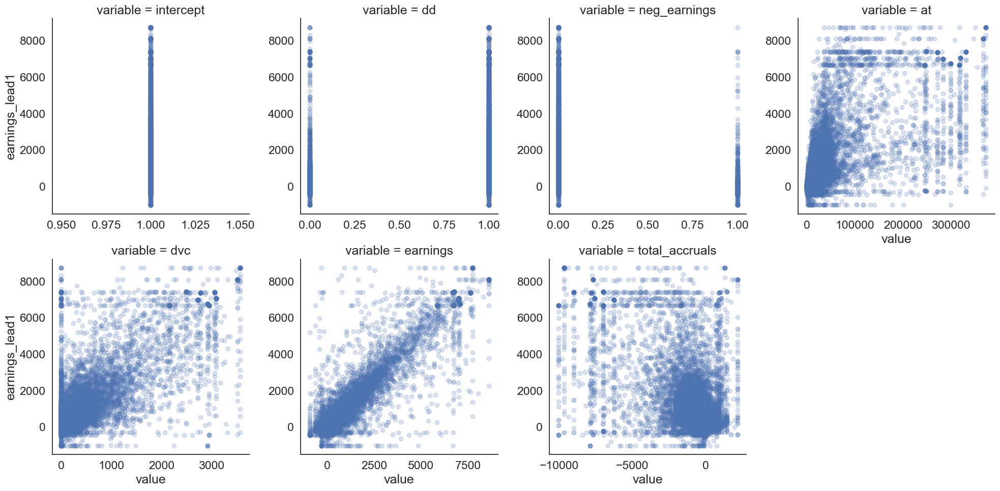

Coefficients: 
0.0000: 	 intercept
8.2008: 	 dd
0.4442: 	 neg_earnings
0.0023: 	 at
0.2570: 	 dvc
0.8021: 	 earnings
-0.0180: 	 total_accruals


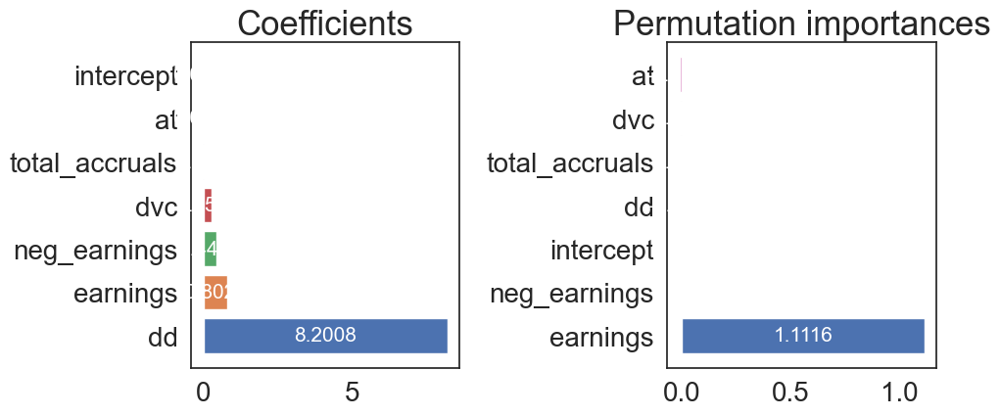

ep
Adj R sq: 	 68.28%
Accuracy: 	 0.0423
Bias: 		 -0.0099



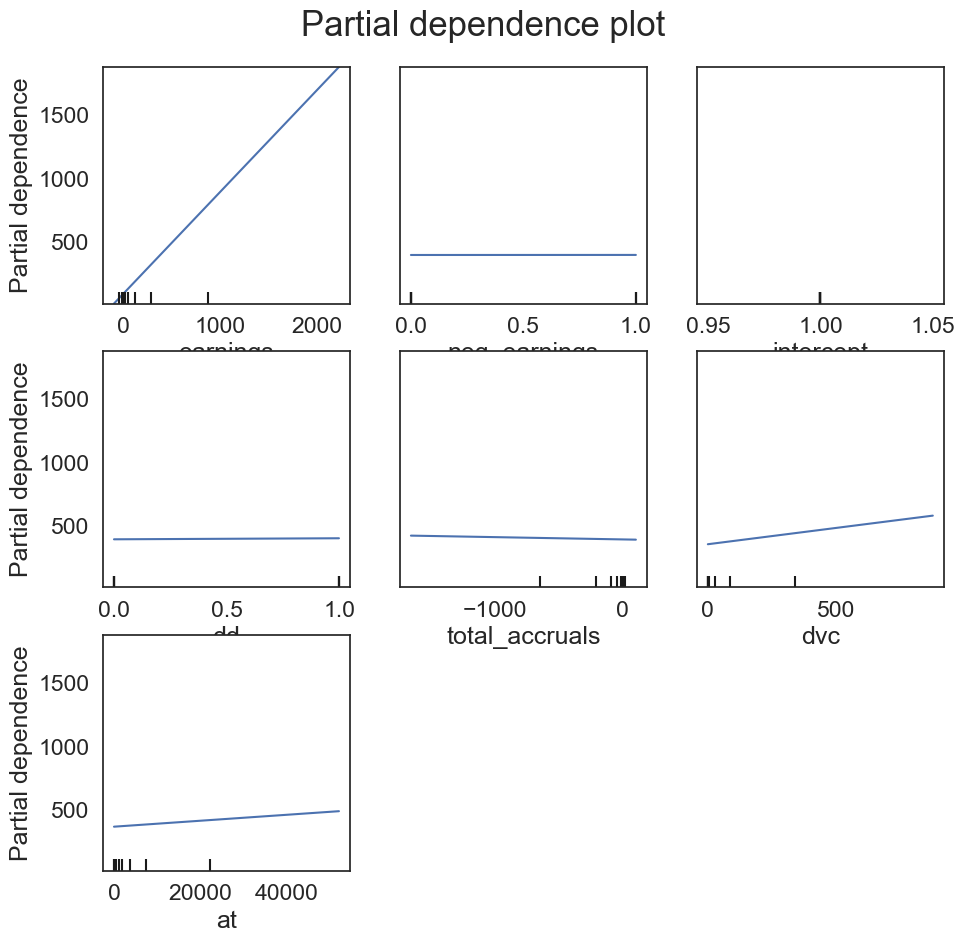

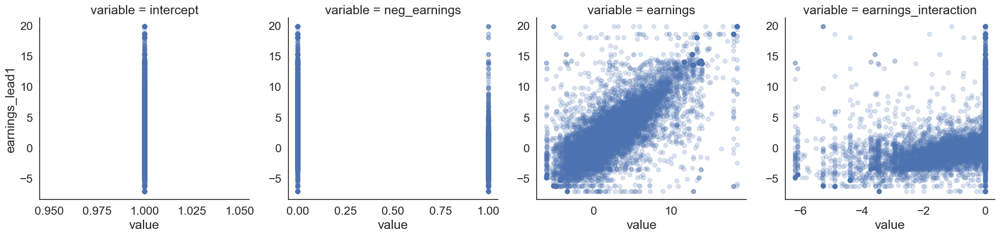

Coefficients: 
0.0000: 	 intercept
-0.2753: 	 neg_earnings
0.9253: 	 earnings
-0.4692: 	 earnings_interaction


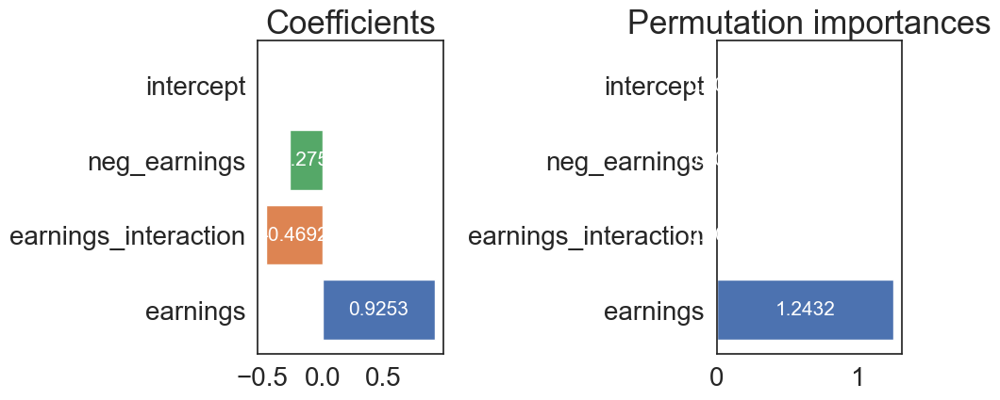

ri
Adj R sq: 	 69.53%
Accuracy: 	 0.0410
Bias: 		 -0.0089



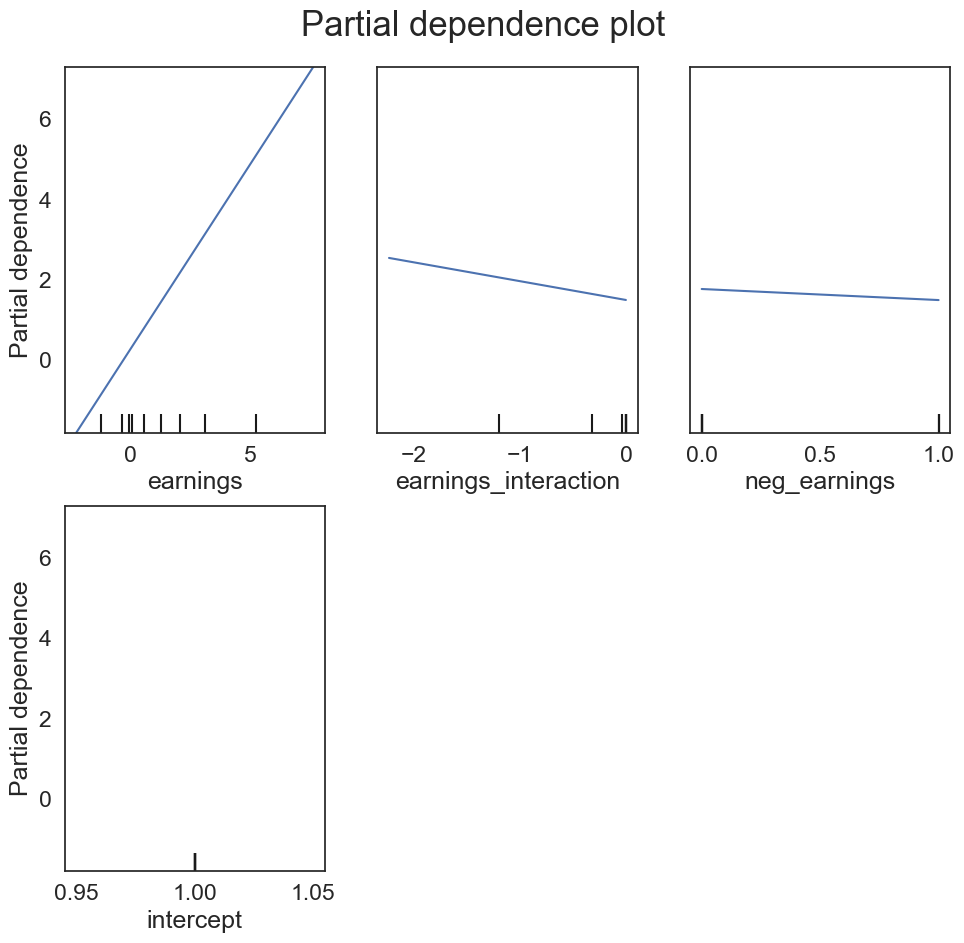

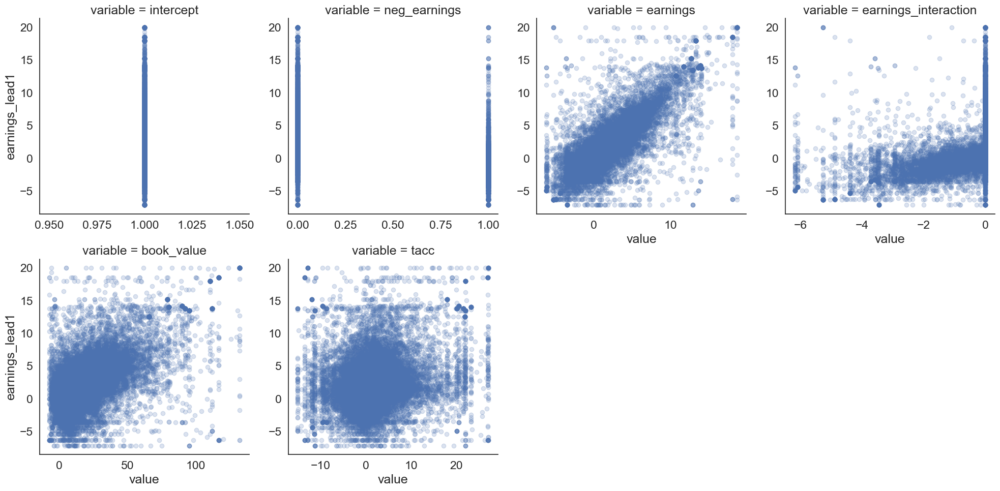

Coefficients: 
0.0000: 	 intercept
-0.1523: 	 neg_earnings
0.7902: 	 earnings
-0.2393: 	 earnings_interaction
0.0294: 	 book_value
-0.0186: 	 tacc


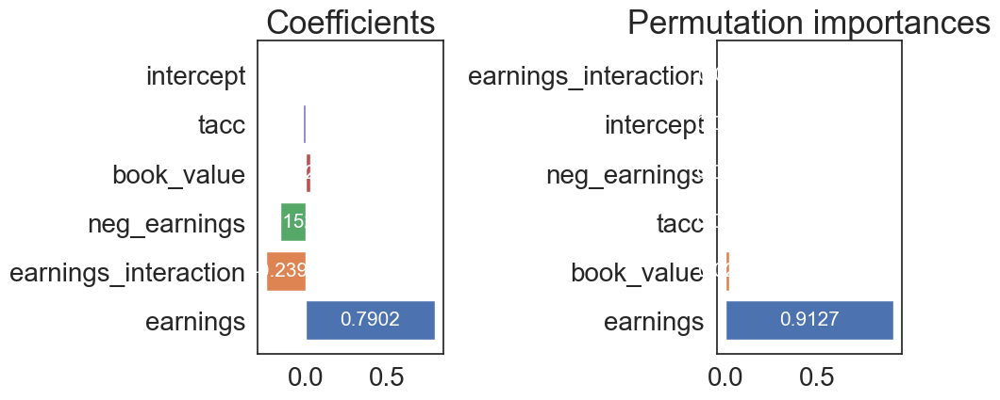

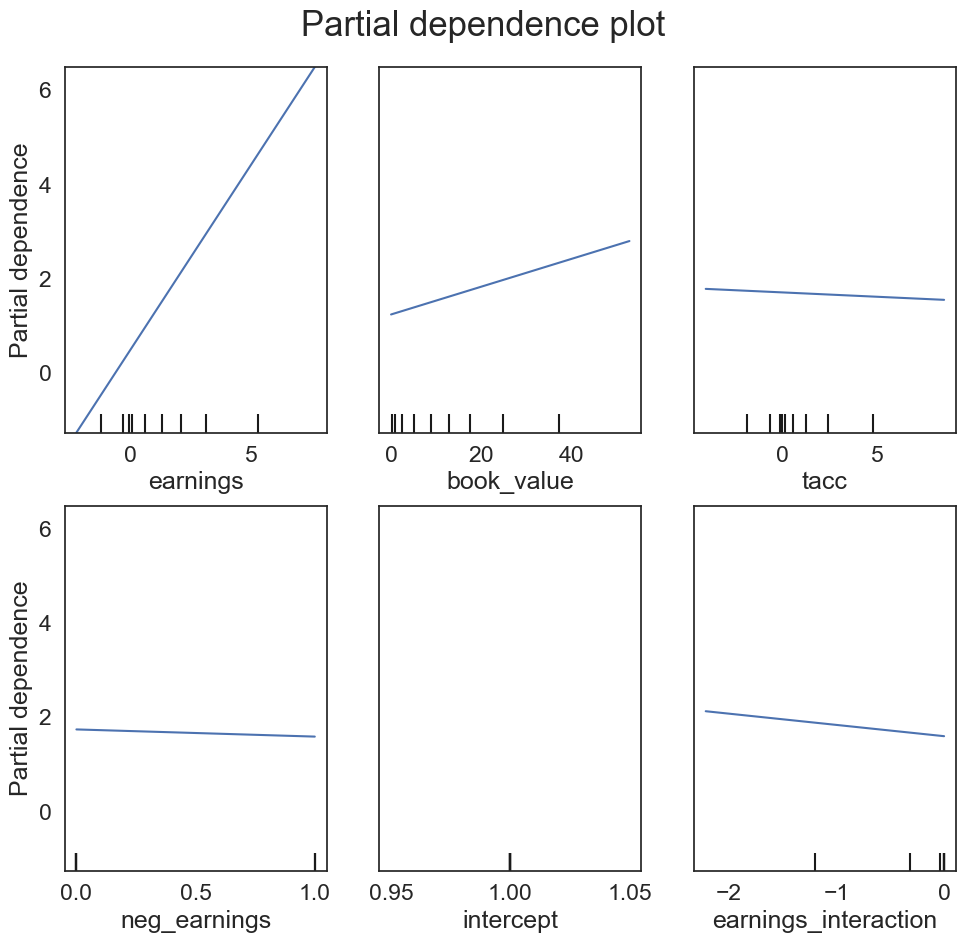

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'hvz': {
            'train_data': hvz_train, 
            'test_data': hvz_test,
            'xvars': ['intercept', 'dd', 'neg_earnings', 'at', 'dvc', 'earnings', 'total_accruals'],
            'performance_scale': 'market_cap'}, # scale bias and accuracy by market cap
        'ep': {
            'train_data': ep_train, 
            'test_data': ep_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction'],
            'performance_scale': 'prccm'}, # scale bias and accuracy by price
        'ri': {
            'train_data': ri_train, 
            'test_data': ri_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction', 'book_value', 'tacc'],
            'performance_scale': 'prccm'} # scale bias and accuracy by price
    },
    plot_var=True,
    plot_inspection=True)

## T + 2 (2021) earnings prediction

Prediction for T+2 (2021)
hvz
Adj R sq: 	 78.69%
Accuracy: 	 0.0917
Bias: 		 -0.0408



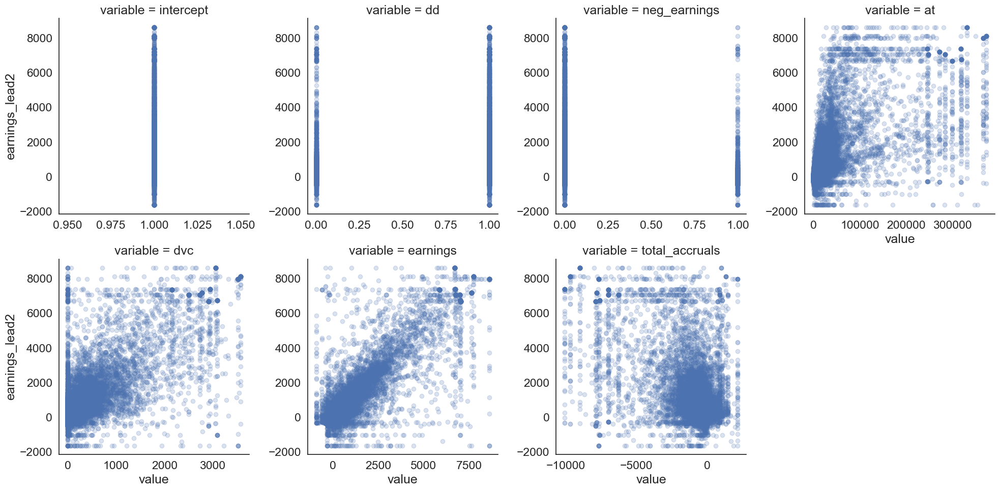

ep
Adj R sq: 	 55.11%
Accuracy: 	 0.0567
Bias: 		 0.0069



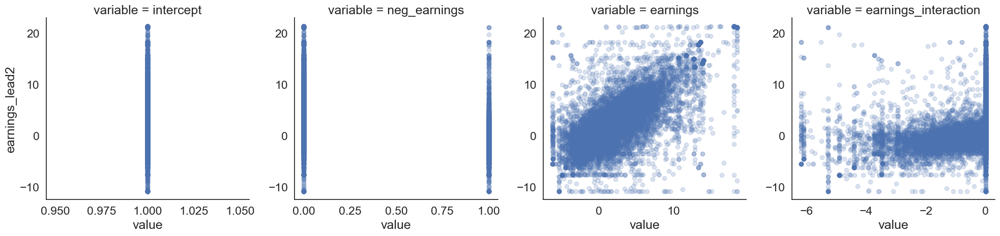

ri
Adj R sq: 	 56.85%
Accuracy: 	 0.0546
Bias: 		 0.0093



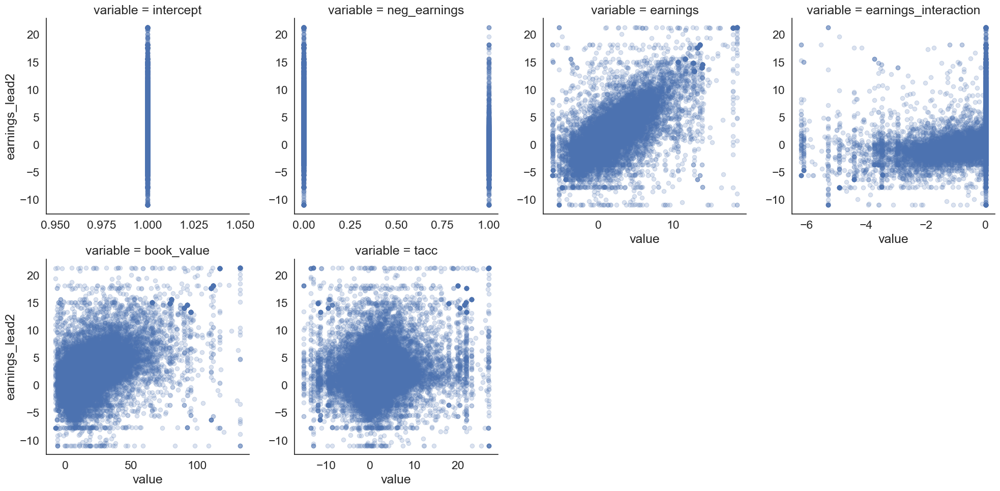

In [ ]:
baseline_performance(
    yvar = 'earnings_lead2',
    params={
        'hvz': {
            'train_data': hvz_train, 
            'test_data': hvz_test,
            'xvars': ['intercept', 'dd', 'neg_earnings', 'at', 'dvc', 'earnings', 'total_accruals'],
            'performance_scale': 'market_cap'},
        'ep': {
            'train_data': ep_train, 
            'test_data': ep_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction'],
            'performance_scale': 'prccm'},
        'ri': {
            'train_data': ri_train, 
            'test_data': ri_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction', 'book_value', 'tacc'],
            'performance_scale': 'prccm'}
    },
    plot_var=True,
    plot_inspection=False
)

## T + 3 (2022) earnings prediction

Prediction for T+3 (2022)
hvz
Adj R sq: 	 76.66%
Accuracy: 	 0.1100
Bias: 		 -0.0576



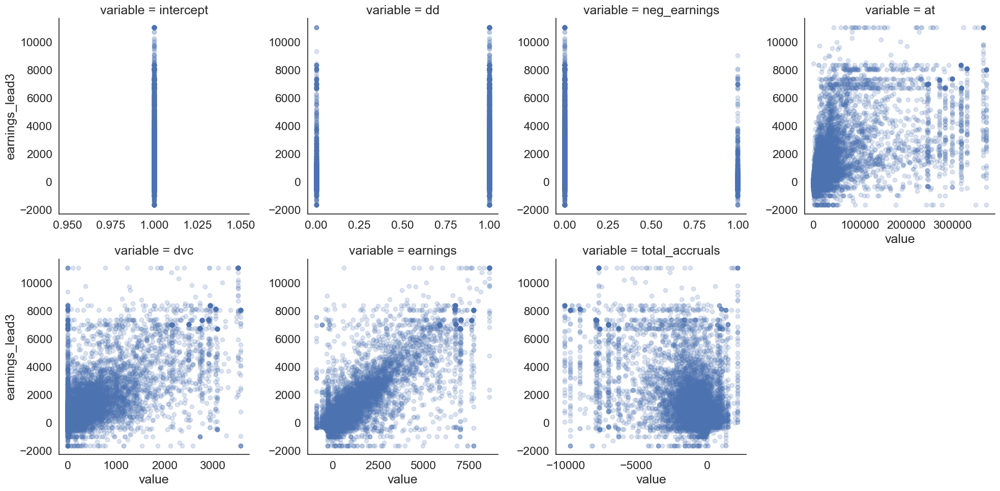

ep
Adj R sq: 	 49.83%
Accuracy: 	 0.0618
Bias: 		 0.0018



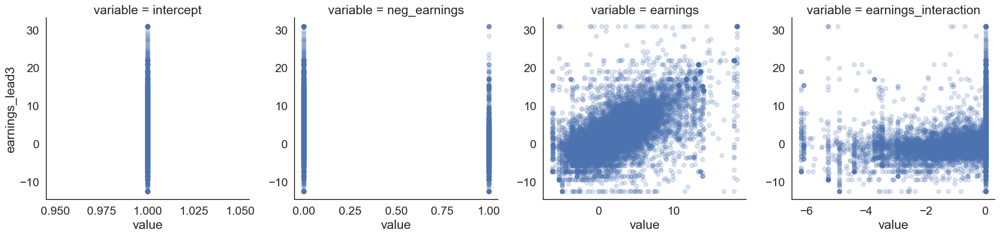

ri
Adj R sq: 	 51.78%
Accuracy: 	 0.0609
Bias: 		 0.0040



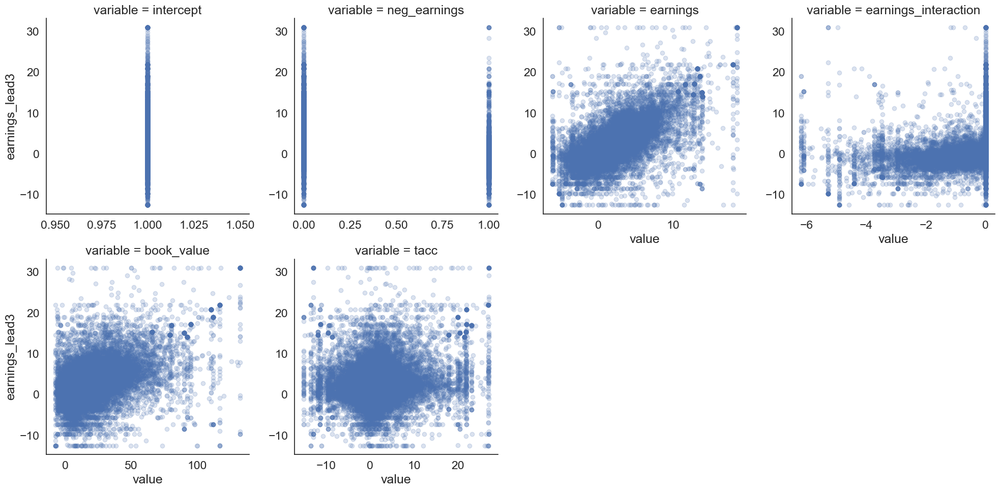

In [ ]:
baseline_performance(
    yvar = 'earnings_lead3',
    params={
        'hvz': {
            'train_data': hvz_train, 
            'test_data': hvz_test,
            'xvars': ['intercept', 'dd', 'neg_earnings', 'at', 'dvc', 'earnings', 'total_accruals'],
            'performance_scale': 'market_cap'},
        'ep': {
            'train_data': ep_train, 
            'test_data': ep_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction'],
            'performance_scale': 'prccm'},
        'ri': {
            'train_data': ri_train, 
            'test_data': ri_test,
            'xvars': ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction', 'book_value', 'tacc'],
            'performance_scale': 'prccm'}
    },
    plot_var=True,
    plot_inspection=False
)

## TBD: 
- residual plots (doesn't look good)
- time series split for cross validation
- use other models

# Model Approach 2: Adding more variables
Based on the best model from approach 1, trying to improve the model by considering additional factors, including the most recent analyst forecast (released prior to earnings), textual analysis of management/other disclosures. 


## IBES latest estimate

In [ ]:
ibes_latest = db.raw_sql(
  """
  WITH 
  analyst_estimates AS (
    SELECT 
      statpers - fpedats AS days_diff,
      ticker,
      statpers,
      fpedats,
      medest,
      actual,
      DATE_PART('year', fpedats) AS fyear
    FROM ibes.statsum_epsus
    WHERE
      fpi = '1'
      AND
      measure = 'EPS'
      AND 
      statpers <= fpedats
      AND
      DATE_PART('year', fpedats) >= 2009
      AND
      DATE_PART('year', fpedats) <= 2022
      --AND
      --ticker IN ('AAPL', 'AMZN')
  ),
  days_diff_analyst AS (
    SELECT 
      *,
      RANK() OVER (PARTITION BY ticker, fpedats ORDER BY days_diff DESC) AS rank
    FROM analyst_estimates
  )
  SELECT 
    ticker, fyear, medest
  FROM days_diff_analyst
  WHERE rank = 1
  """) 

In [ ]:
# link ibes to compustat
ibes_compustat_link = pd.read_excel(f'{path}/IBES Compustat Link File.xls',
                                    names=['gvkey', 'ticker'])
ibes_latest = ibes_latest.merge(ibes_compustat_link, how='left', on=['ticker'])
ibes_latest = ibes_latest.dropna()
ibes_latest.rename(columns={'ticker': 'tic'}, inplace=True)
ibes_latest['gvkey'] = ibes_latest['gvkey'].astype(int).astype(str).str.pad(6, fillchar='0')
ibes_latest

,tic,fyear,medest,gvkey
0,0000,2014.0,1.20,192458
1,0000,2015.0,0.89,192458
2,0000,2016.0,1.19,192458
3,0001,2014.0,0.91,018660
4,0001,2015.0,0.78,018660
...,...,...,...,...
68787,ZYNX,2018.0,0.25,129441
68788,ZYNX,2019.0,0.23,129441
68789,ZYNX,2020.0,0.24,129441
68790,ZYNX,2021.0,0.38,129441


In [ ]:
sorted(ibes_latest.fyear.unique())

[2009.0,
 2010.0,
 2011.0,
 2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0,
 2020.0,
 2021.0,
 2022.0]

## Extra variables from wrds

In [ ]:
extra_wrds = db.raw_sql(
    """
    WITH 
    computstat_table AS ( --create computstat_table subquery for fundamentals data during 2012 and 2022
        SELECT 
        gvkey, cik, conm, tic, fyear, datadate,
        oancf, --operating cash flow
        sale, --sales
        oibdp, --operating income before depreciation
        opiti, --operating income
        pi, --pretax income
        gp, --gross profit
        citotal, --comprehensive income
        at, --total assets
        act, --current assets
        lct, --current liabilities
        cogs, --cost of goods sold
        invt, --inventory
        LAG(invt, 1) OVER (PARTITION BY gvkey ORDER BY fyear) AS invt_lag1, --inventory lagged 1 year
        LAG(sale, 1) OVER (PARTITION BY gvkey ORDER BY fyear) AS sale_lag1 --sales lagged 1 year
        FROM comp.funda
        WHERE 
        fyear >= 2009 -- start in 2010 so lagged variables are available for 2012
        AND 
        fyear <= 2022
        AND
        at != 0 AND lct != 0 AND sale != 0
        AND
        indfmt = 'INDL' AND datafmt = 'STD' AND popsrc = 'D' AND consol = 'C' --filters from Quercus
        --AND 
        --tic = 'AAPL'
        --AND
        --cik = '0000001750'
        --AND
        --gvkey = '018660'
    )
    
    SELECT 
        gvkey, tic, fyear,
        (oancf - sale - (sale - sale_lag1)) / at AS accruals, --operating cash flow - sales - change in sales / total assets
        (cogs - (invt - invt_lag1)) / at AS prod_abnormal,
        (sale - sale_lag1) / sale_lag1 AS sale_chg, --change in sales
        gp / sale AS gpm, --gross profit / revenue
        oibdp / sale AS opm, --operating income / revenue
        pi / sale AS ptpm, --pretax income / revenue
        sale / at AS asset_turnover, --revenue / total assets
        act / lct AS current_ratio --current assets / current liabilities
    FROM computstat_table
    ORDER BY gvkey, fyear
    --LIMIT 20
    """)

extra_wrds

,gvkey,tic,fyear,accruals,prod_abnormal,sale_chg,gpm,opm,ptpm,asset_turnover,current_ratio
0,001004,AIR,2009.0,NaN,NaN,NaN,0.211699,0.099357,0.047471,0.900808,2.652216
1,001004,AIR,2010.0,-1.227201,0.820378,0.313302,0.207070,0.110550,0.061102,1.042293,2.197027
2,001004,AIR,2011.0,-1.037959,0.715017,0.168217,0.198646,0.107348,0.045075,0.944821,2.246859
3,001004,AIR,2012.0,-0.981235,0.810217,0.044638,0.208851,0.113147,0.037931,1.014133,2.657326
4,001004,AIR,2013.0,-0.801591,0.696249,-0.060957,0.222899,0.125799,0.051744,0.925210,2.777667
...,...,...,...,...,...,...,...,...,...,...,...
81326,351590,DTRUY,2020.0,-0.496190,0.580763,-0.163499,0.214728,0.064477,0.009274,0.720418,1.189914
81327,351590,DTRUY,2021.0,-0.716421,0.539301,0.041812,0.228121,0.086485,0.082336,0.725620,1.611451
81328,351590,DTRUY,2022.0,-0.935817,0.604341,0.201161,0.229145,0.104824,0.067856,0.794572,1.543166
81329,353444,HLN,2021.0,NaN,NaN,NaN,0.656050,0.245993,0.171399,0.277060,1.239028


## Federal funds
- https://wrds-www.wharton.upenn.edu/pages/get-data/federal-reserve-bank-reports/interest-rates/data/

In [ ]:
fed_funds = db.raw_sql(
    """
    WITH 
    monthly_ffr AS (
        SELECT 
            date, 
            DATE_PART('year', date) AS fyear,
            FF_O 
        FROM frb_all.rates_monthly 
        WHERE date >= '2009-01-01'
    )
    
    SELECT
        fyear, 
        PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY FF_O) AS median_ffr,
        MAX(FF_O) AS max_ffr
    FROM monthly_ffr
    GROUP BY fyear
    """ )

## FX rate
- https://wrds-www.wharton.upenn.edu/pages/get-data/federal-reserve-bank-reports/foreign-exchange-rates/data/

In [ ]:
# foreign exchange for different currencies vs USD
fx_data_grouped = db.raw_sql(
    """
    WITH 
    monthly_fx AS (
        SELECT 
            date, 
            DATE_PART('year', date) AS fyear,
            twexb AS broad, 
            twexm AS major_currencies, 
            twexo AS other_currencies, 
            exchus AS china
        FROM frb_all.fx_monthly
        WHERE date >= '2009-01-01'
    )
    
    SELECT
        fyear,
        PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY broad) AS broad_median,
        MAX(broad) AS broad_max,
        PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY major_currencies) AS major_currencies_median,
        MAX(major_currencies) AS major_currencies_max,
        PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY other_currencies) AS other_currencies_median,
        MAX(other_currencies) AS other_currencies_max,
        PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY china) AS china_median,
        MAX(china) AS china_max
    FROM monthly_fx
    GROUP BY fyear
    """)

## USA and world GDP

In [ ]:
# USA and world GDP, inflation, consumer spending
countries = ["USA"]
indicators = {"NY.GDP.MKTP.CD": "GDP", "FP.CPI.TOTL.ZG": "Inflation", "NE.CON.TOTL.CD": "Consumer Spending"}
world_macro_indicators_temp = wbdata.get_dataframe(indicators).reset_index()
USA_macro_indicators = wbdata.get_dataframe(indicators, country=countries).reset_index()
USA_macro_indicators = USA_macro_indicators[USA_macro_indicators['date'].astype(int) >= 2009]
USA_macro_indicators.rename(columns= {'date': 'fyear', 'GDP': 'USA_GDP', 'Inflation': 'USA_Inflation', 'Consumer Spending': 'USA_Consumer_Spending'}, inplace=True)
USA_macro_indicators.fyear = USA_macro_indicators.fyear.astype(float)

world_macro_indicators_temp = world_macro_indicators_temp[world_macro_indicators_temp['date'].astype(int) >= 2009]
world_macro_indicators = pd.DataFrame()
world_macro_indicators['WORLD_GDP'] = world_macro_indicators_temp.groupby('date')['GDP'].sum()
world_macro_indicators['WORLD_Inflation'] = world_macro_indicators_temp.groupby('date')['Inflation'].mean()
world_macro_indicators['WORLD_Consumer_spending'] = world_macro_indicators_temp.groupby('date')['Consumer Spending'].sum()
world_macro_indicators.reset_index(inplace=True)
world_macro_indicators.rename(columns= {'date': 'fyear'}, inplace=True)
world_macro_indicators.fyear = world_macro_indicators.fyear.astype(float)

## Butter milk
country
'Bangladesh': '16',

elements
'Production Quantity': '2510',

items
'Butter and ghee of sheep milk': '983',
 'Butter of buffalo milk': '952',
 'Butter of cow milk': '886',
 'Butter of goat milk': '1022',

In [ ]:
all_butter_products_df = faostat.get_data_df('QCL',pars={'elements':[2510],'items':['983', '952', '886', '1022'], 'areas':16})
all_butter_products_df = all_butter_products_df[['Year', 'Value', 'Item']]
all_butter_products_df.Year = all_butter_products_df.Year.astype(float)
all_butter_products_df = all_butter_products_df[(all_butter_products_df["Item"] == 'Butter of cow milk') & (all_butter_products_df["Year"] >= 2009)]

butter_products_df = all_butter_products_df.groupby(['Year'])['Value'].agg('sum').reset_index()
butter_products_df.rename(columns= {'Year': 'fyear', 'Value': 'butter_production'}, inplace=True)

In [ ]:
extra_macro = fx_data_grouped.\
    merge(USA_macro_indicators, on='fyear', how = 'outer').\
    merge(world_macro_indicators, on='fyear', how = 'outer').\
    merge(butter_products_df, on='fyear', how = 'outer').\
    sort_values('fyear')
    
# rebasing to 2009
extra_macro = extra_macro.astype(float)
extra_macro.iloc[:, 1:] = extra_macro.iloc[:, 1:].div(extra_macro.iloc[0, 1:])

# include federal funds rate
extra_macro = extra_macro.merge(fed_funds, on='fyear', how = 'outer').sort_values('fyear')
extra_macro

,fyear,broad_median,broad_max,major_currencies_median,major_currencies_max,other_currencies_median,other_currencies_max,china_median,china_max,USA_GDP,USA_Inflation,USA_Consumer_Spending,WORLD_GDP,WORLD_Inflation,WORLD_Consumer_spending,butter_production,median_ffr,max_ffr
0,2009.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.155,0.22
1,2010.0,0.963533,0.926542,0.981265,0.947836,0.948661,0.920601,0.995857,0.998859,1.039432,-4.612743,1.036241,1.110610,1.037835,1.085512,1.048544,0.185,0.20
2,2011.0,0.912230,0.880514,0.931399,0.889519,0.897562,0.872673,0.946554,0.964908,1.077473,-8.878849,1.071850,1.244662,1.573278,1.203636,1.077670,0.090,0.17
3,2012.0,0.924904,0.890671,0.965978,0.913782,0.897972,0.873625,0.924420,0.932039,1.122662,-5.820163,1.100462,1.277600,1.371282,1.232610,1.106796,0.150,0.16
4,2013.0,0.930328,0.881249,1.006868,0.941233,0.877960,0.842224,0.897982,0.911648,1.163359,-4.119949,1.127511,1.323247,1.007275,1.279068,1.116505,0.090,0.15
5,2014.0,0.941701,0.934481,1.020887,1.025873,0.884965,0.868925,0.902264,0.912482,1.212226,-4.562621,1.169525,1.361417,0.900879,1.314010,1.162136,0.090,0.12
6,2015.0,1.047303,1.022739,1.206211,1.147632,0.939225,0.935587,0.914224,0.943361,1.257490,-0.333648,1.206725,1.277157,0.875415,1.233945,1.165049,0.120,0.24
7,2016.0,1.083422,1.068042,1.208752,1.176668,1.001306,0.990770,0.968783,1.012214,1.291271,-3.548295,1.245989,1.295776,1.464142,1.256827,1.211233,0.385,0.54
8,2017.0,1.074509,1.066765,1.211746,1.167676,0.981501,0.994474,0.993683,1.008440,1.345300,-5.991091,1.294980,1.388667,1.149401,1.335317,1.224893,1.095,1.30
9,2018.0,1.097863,1.066245,1.211288,1.147196,1.019318,1.008274,0.964808,1.014686,1.418218,-6.869945,1.360843,1.475392,0.998725,1.408497,1.269932,1.865,2.27


## Merge all variables

In [ ]:
extend_df = residual_income.\
        merge(extra_wrds, on=['gvkey', 'tic', 'fyear'], how='left').\
        merge(ibes_latest, on=['gvkey', 'tic', 'fyear'], how='left').\
        merge(extra_macro, on='fyear', how='left')

extend_df

,gvkey,cik,conm,tic,fyear,datadate,cshom,prccm,market_cap,earnings_lead1,earnings_lead2,earnings_lead3,intercept,neg_earnings,earnings,earnings_interaction,book_value,tacc,accruals,prod_abnormal,sale_chg,gpm,opm,ptpm,asset_turnover,current_ratio,medest,broad_median,broad_max,major_currencies_median,major_currencies_max,other_currencies_median,other_currencies_max,china_median,china_max,USA_GDP,USA_Inflation,USA_Consumer_Spending,WORLD_GDP,WORLD_Inflation,WORLD_Consumer_spending,butter_production,median_ffr,max_ffr
0,001004,0000001750,AAR CORP,AIR,2009.0,2010-05-31,38.697,16.0500,621.086850,74.675,81.587,76.1,1,0,48.930,0.000,746.906,122.590,NaN,NaN,NaN,0.211699,0.099357,0.047471,0.900808,2.652216,1.87,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.155,0.22
1,001004,0000001750,AAR CORP,AIR,2010.0,2011-05-31,39.025,16.7400,653.278500,81.587,76.100,72.9,1,0,74.675,0.000,835.845,110.876,-1.227201,0.820378,0.313302,0.207070,0.110550,0.061102,1.042293,2.197027,1.26,0.963533,0.926542,0.981265,0.947836,0.948661,0.920601,0.995857,0.998859,1.039432,-4.612743,1.036241,1.110610,1.037835,1.085512,1.048544,0.185,0.20
2,001004,0000001750,AAR CORP,AIR,2011.0,2012-05-31,39.739,27.0900,1076.529510,76.100,72.900,-6.1,1,0,81.587,0.000,864.649,20.446,-1.037959,0.715017,0.168217,0.198646,0.107348,0.045075,0.944821,2.246859,1.67,0.912230,0.880514,0.931399,0.889519,0.897562,0.872673,0.946554,0.964908,1.077473,-8.878849,1.071850,1.244662,1.573278,1.203636,1.077670,0.090,0.17
3,001004,0000001750,AAR CORP,AIR,2012.0,2013-05-31,40.288,13.4800,543.082240,72.900,-6.100,40.9,1,0,76.100,0.000,918.600,45.898,-0.981235,0.810217,0.044638,0.208851,0.113147,0.037931,1.014133,2.657326,1.83,0.924904,0.890671,0.965978,0.913782,0.897972,0.873625,0.924420,0.932039,1.122662,-5.820163,1.100462,1.277600,1.371282,1.232610,1.106796,0.150,0.16
4,001004,0000001750,AAR CORP,AIR,2013.0,2014-05-31,39.733,21.9800,873.331340,-6.100,40.900,47.6,1,0,72.900,0.000,999.500,67.300,-0.801591,0.696249,-0.060957,0.222899,0.125799,0.051744,0.925210,2.777667,1.81,0.930328,0.881249,1.006868,0.941233,0.877960,0.842224,0.897982,0.911648,1.163359,-4.119949,1.127511,1.323247,1.007275,1.279068,1.116505,0.090,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127233,349972,0001857044,INDAPTUS THERAPEUTICS INC,INDP,2022.0,2022-12-31,8.259,2.6100,21.555990,NaN,NaN,NaN,1,1,-14.347,-14.347,24.631,18.236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127234,349994,0001892500,CLEARMIND MEDICINE INC,CMND,2022.0,2022-10-31,37.565,0.2771,10.409261,NaN,NaN,NaN,1,1,-9.411,-9.411,-1.510,-1.889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127235,351038,0001671502,CELLECT BIOTECHNOLOGY LTD,QNRX,2022.0,2022-12-31,3354.654,0.4503,1510.600696,NaN,NaN,NaN,1,1,-9.797,-9.797,7.407,11.372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127236,351491,None,IVECO GROUP N V,IVCGF,2022.0,2022-12-31,271.215,5.2360,1420.081740,NaN,NaN,NaN,1,0,235.123,0.000,2514.750,-1499.167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
wrds_var = ['accruals', 'sale_chg', 'gpm', 'opm', 'ptpm', 'asset_turnover', 'current_ratio', 'prod_abnormal']
macro_var = ['broad_median', 'broad_max', 'major_currencies_median', 'major_currencies_max', 'other_currencies_median', 'other_currencies_max', 'china_median', 'china_max', 'USA_GDP', 'USA_Inflation', 'USA_Consumer_Spending', 'WORLD_GDP', 'WORLD_Inflation', 'WORLD_Consumer_spending', 'butter_production', 'median_ffr', 'max_ffr']
ibes_var = ['medest']
ri_var = ['intercept', 'neg_earnings', 'earnings', 'earnings_interaction', 'book_value', 'tacc']

ri_train_extend, ri_test_extend, ri_2022_extend = clean_df(
    data = extend_df,
    xvars_non_scaled = ['intercept', 'neg_earnings'] + ibes_var + wrds_var + macro_var,
    xvars_scaled = ['earnings', 'earnings_interaction', 'book_value', 'tacc'],
    denominator = 'cshom' # normalize by shares outstanding
    ).pipe(train_test_split)

### LightGBM

Prediction for T+1 (2020)
ri
Adj R sq: 	 80.92%
Accuracy: 	 0.0250
Bias: 		 -0.0047

Coefficients: 
0.0000: 	 intercept
3.0000: 	 neg_earnings
887.0000: 	 earnings
186.0000: 	 earnings_interaction
990.0000: 	 book_value
934.0000: 	 tacc


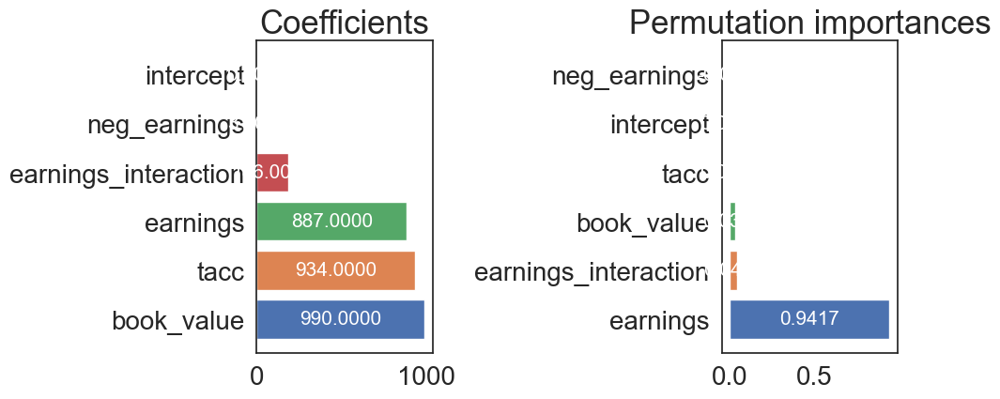

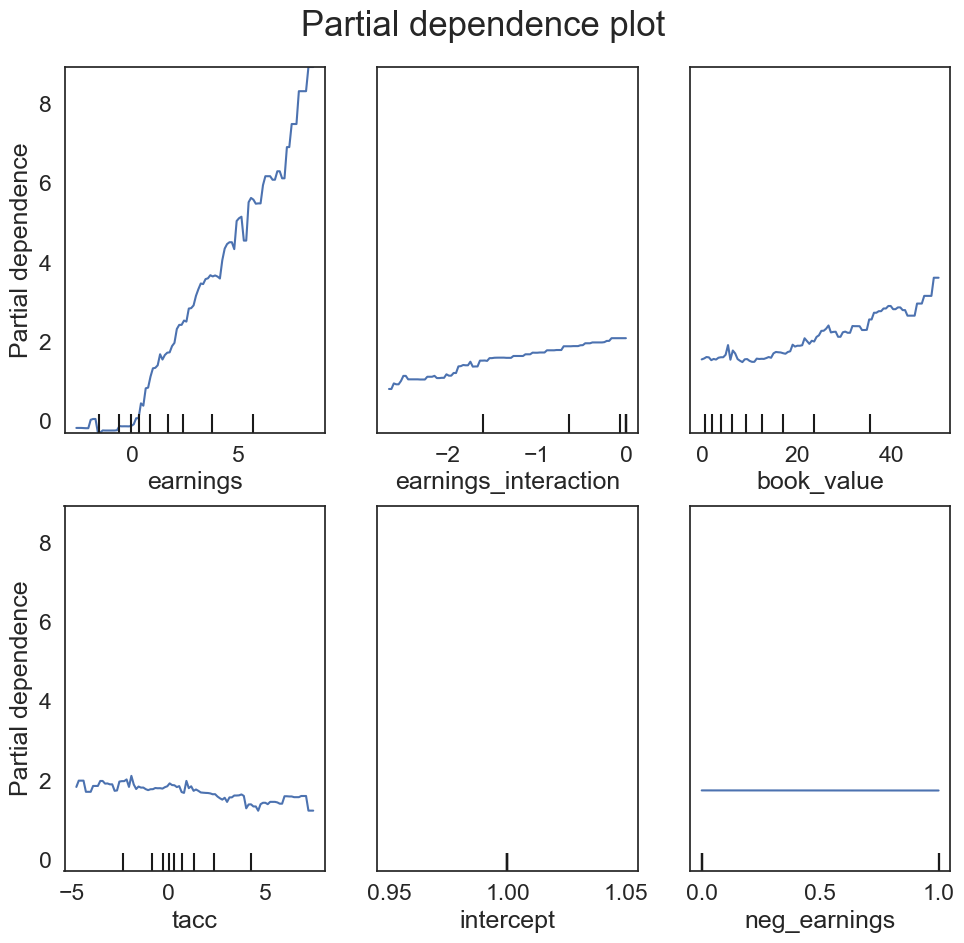

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=True
)

### just RI

Prediction for T+1 (2020)
ri
Adj R sq: 	 80.92%
Accuracy: 	 0.0250
Bias: 		 -0.0047

Coefficients: 
0.0000: 	 intercept
3.0000: 	 neg_earnings
887.0000: 	 earnings
186.0000: 	 earnings_interaction
990.0000: 	 book_value
934.0000: 	 tacc


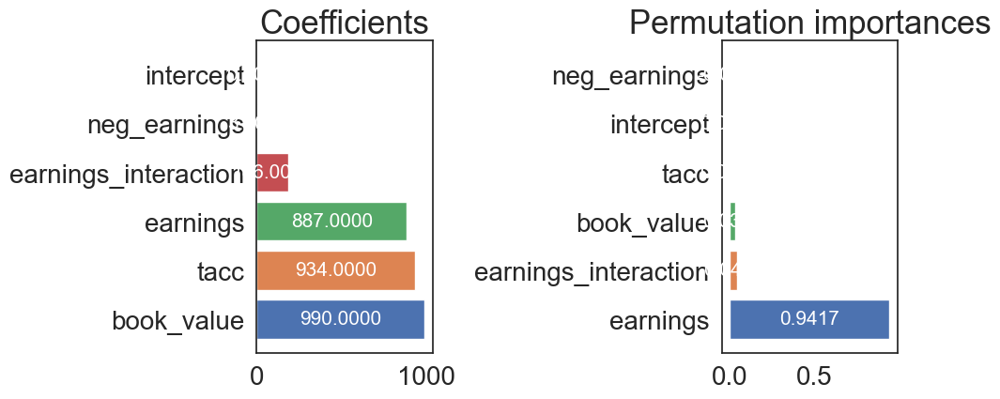

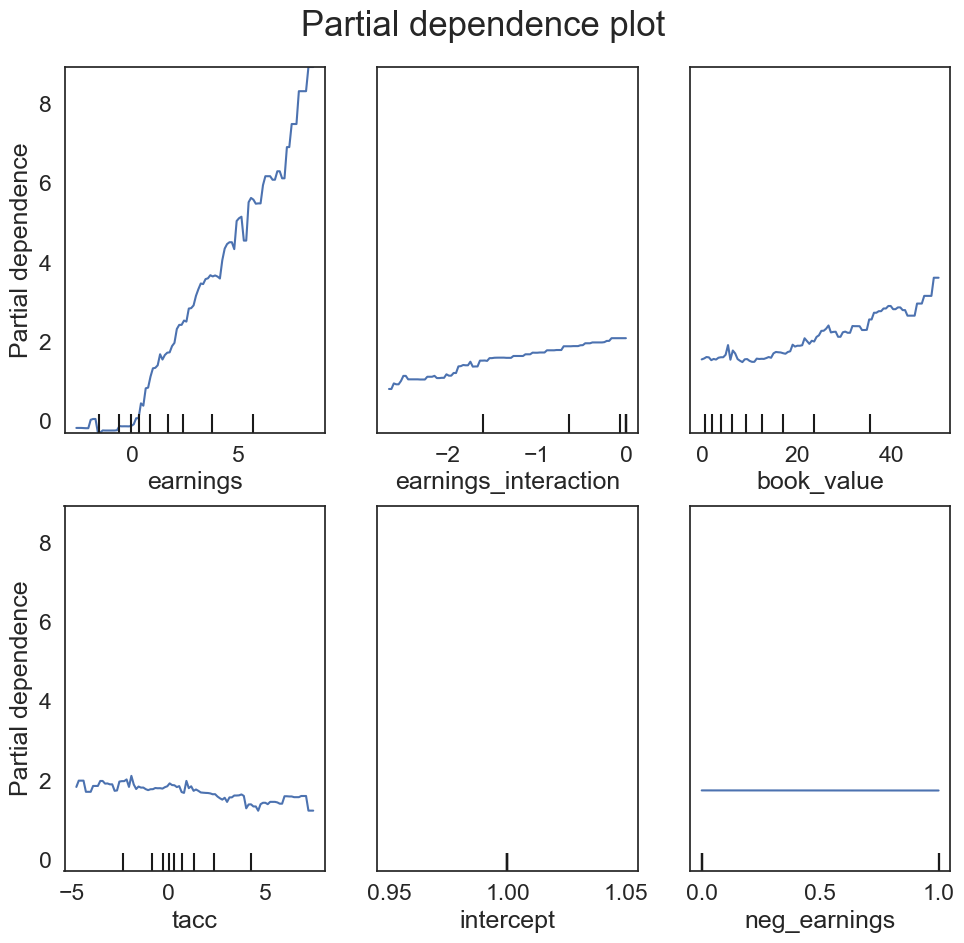

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=True
)

In [ ]:
baseline_performance(
    yvar = 'earnings_lead2',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False
)

Prediction for T+2 (2021)
ri
Adj R sq: 	 69.85%
Accuracy: 	 0.0352
Bias: 		 0.0043



In [ ]:
baseline_performance(
    yvar = 'earnings_lead3',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False
)

Prediction for T+3 (2022)
ri
Adj R sq: 	 65.63%
Accuracy: 	 0.0425
Bias: 		 0.0010



### RI + IBES

Prediction for T+1 (2020)
ri
Adj R sq: 	 83.26%
Accuracy: 	 0.0257
Bias: 		 -0.0047

Coefficients: 
0.0000: 	 intercept
1.0000: 	 neg_earnings
690.0000: 	 earnings
156.0000: 	 earnings_interaction
724.0000: 	 book_value
662.0000: 	 tacc
767.0000: 	 medest


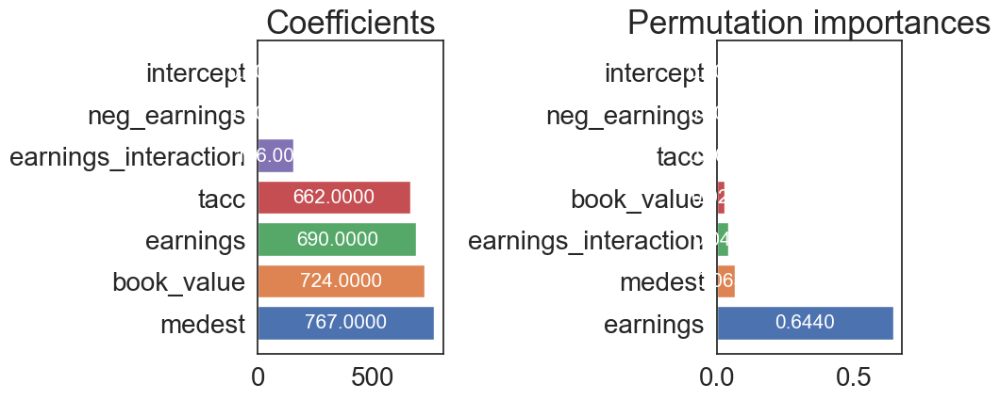

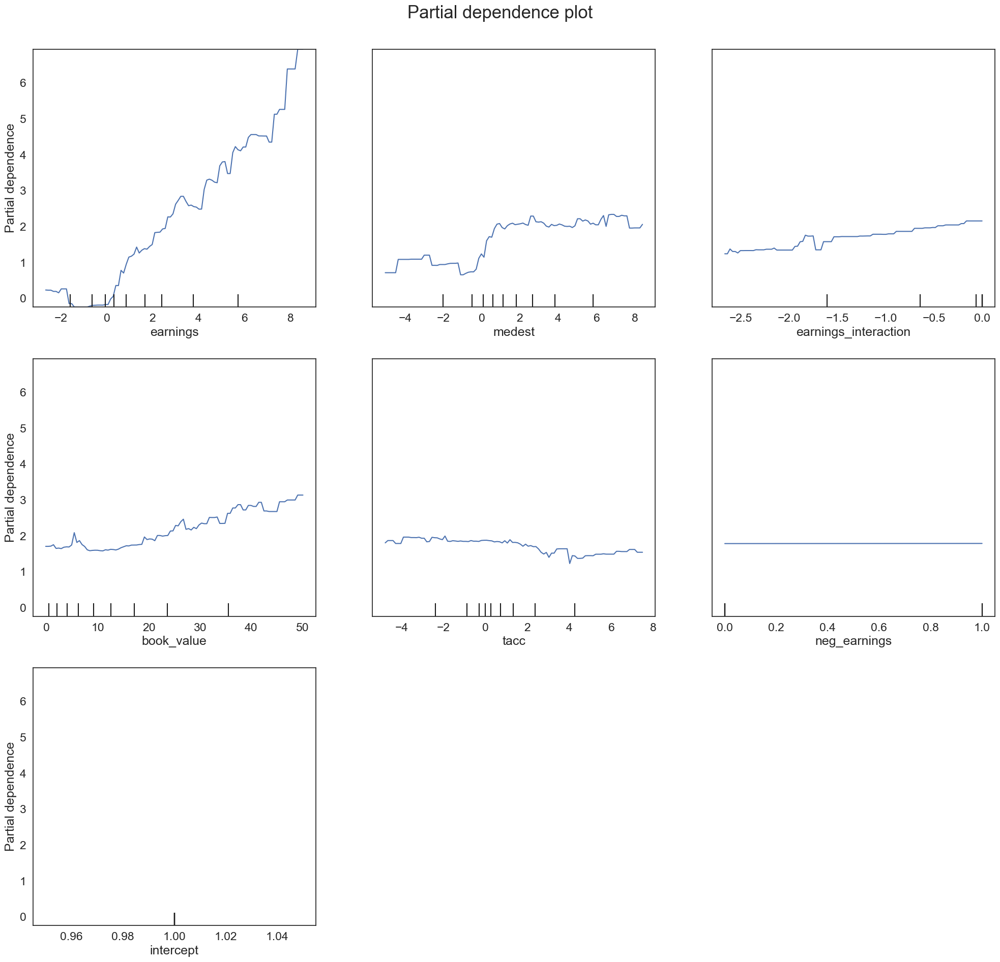

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=True,
    partial_dependence_figsize=(20,20)
)

In [ ]:
baseline_performance(
    yvar = 'earnings_lead2',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False
)

Prediction for T+2 (2021)
ri
Adj R sq: 	 73.28%
Accuracy: 	 0.0359
Bias: 		 0.0054



In [ ]:
baseline_performance(
    yvar = 'earnings_lead3',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False
)

Prediction for T+3 (2022)
ri
Adj R sq: 	 69.03%
Accuracy: 	 0.0414
Bias: 		 0.0017



### RI + IBES + WRDS

Prediction for T+1 (2020)
ri
Adj R sq: 	 87.75%
Accuracy: 	 0.0260
Bias: 		 -0.0041

Coefficients: 
0.0000: 	 intercept
0.0000: 	 neg_earnings
362.0000: 	 earnings
69.0000: 	 earnings_interaction
370.0000: 	 book_value
297.0000: 	 tacc
311.0000: 	 medest
140.0000: 	 accruals
292.0000: 	 sale_chg
178.0000: 	 gpm
198.0000: 	 opm
272.0000: 	 ptpm
156.0000: 	 asset_turnover
226.0000: 	 current_ratio
129.0000: 	 prod_abnormal


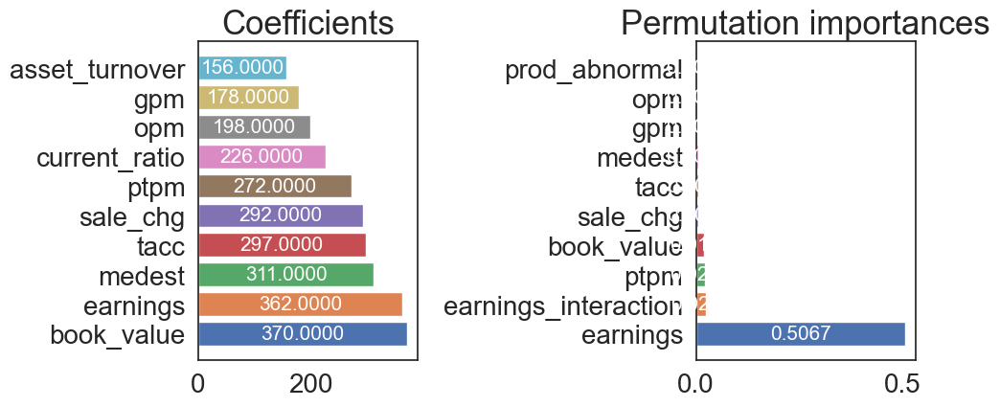

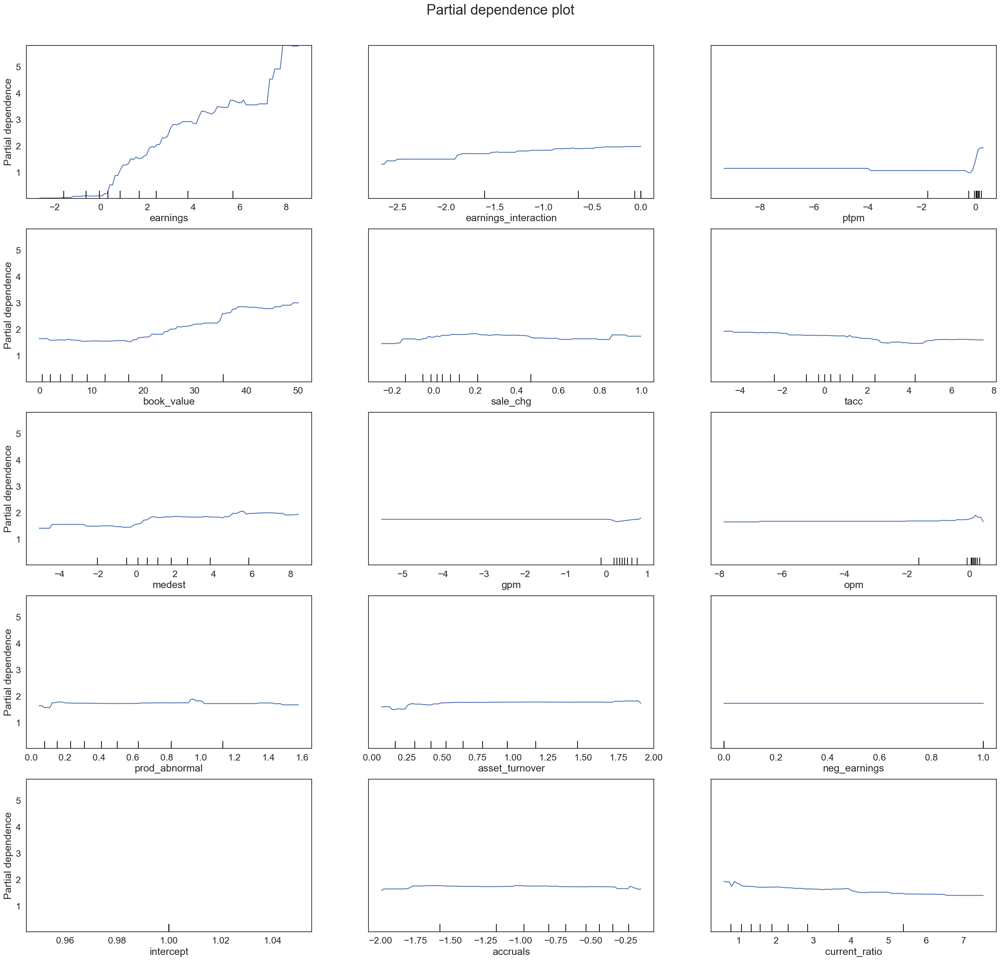

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=True,
    partial_dependence_figsize=(25,25)
)

In [ ]:
baseline_performance(
    yvar = 'earnings_lead2',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False,
    partial_dependence_figsize=(25,25)
)

Prediction for T+2 (2021)
ri
Adj R sq: 	 80.99%
Accuracy: 	 0.0352
Bias: 		 0.0054



In [ ]:
baseline_performance(
    yvar = 'earnings_lead3',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False,
    partial_dependence_figsize=(25,25)
)

Prediction for T+3 (2022)
ri
Adj R sq: 	 78.18%
Accuracy: 	 0.0427
Bias: 		 0.0015



### RI + IBES + WRDS + macro

Prediction for T+1 (2020)
ri
Adj R sq: 	 88.68%
Accuracy: 	 0.0266
Bias: 		 -0.0076

Coefficients: 
0.0000: 	 intercept
0.0000: 	 neg_earnings
367.0000: 	 earnings
62.0000: 	 earnings_interaction
318.0000: 	 book_value
283.0000: 	 tacc
263.0000: 	 medest
135.0000: 	 accruals
279.0000: 	 sale_chg
176.0000: 	 gpm
162.0000: 	 opm
224.0000: 	 ptpm
133.0000: 	 asset_turnover
177.0000: 	 current_ratio
125.0000: 	 prod_abnormal
46.0000: 	 broad_median
42.0000: 	 broad_max
20.0000: 	 major_currencies_median
3.0000: 	 major_currencies_max
13.0000: 	 other_currencies_median
0.0000: 	 other_currencies_max
26.0000: 	 china_median
1.0000: 	 china_max
3.0000: 	 USA_GDP
30.0000: 	 USA_Inflation
0.0000: 	 USA_Consumer_Spending
28.0000: 	 WORLD_GDP
57.0000: 	 WORLD_Inflation
0.0000: 	 WORLD_Consumer_spending
0.0000: 	 butter_production
6.0000: 	 median_ffr
21.0000: 	 max_ffr


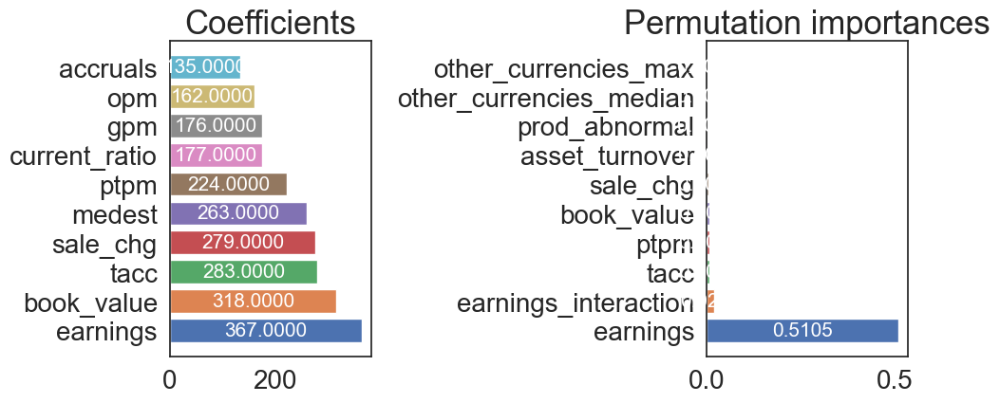

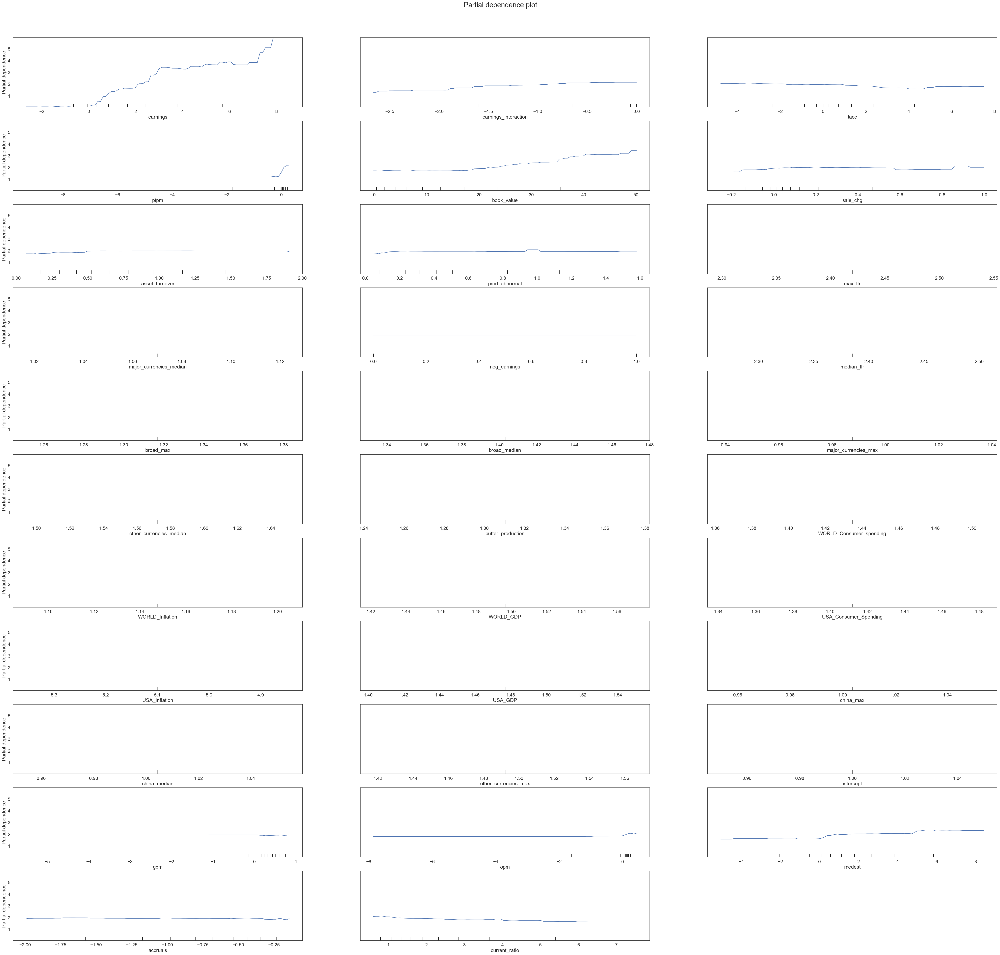

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=True,
    partial_dependence_figsize=(50,50)
)

In [ ]:
baseline_performance(
    yvar = 'earnings_lead2',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False,
    partial_dependence_figsize=(50,50)
)

Prediction for T+2 (2021)
ri
Adj R sq: 	 82.61%
Accuracy: 	 0.0373
Bias: 		 0.0077



In [ ]:
baseline_performance(
    yvar = 'earnings_lead3',
    params={
        'ri': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    },
    model=LGBMRegressor(),
    plot_var=False,
    plot_inspection=False,
    partial_dependence_figsize=(50,50)
)

Prediction for T+3 (2022)
ri
Adj R sq: 	 79.67%
Accuracy: 	 0.0425
Bias: 		 0.0023



## Textual analysis

In [ ]:
temp = pd.read_csv('./Group 14 accounting final project/temp.csv')
temp

,ticker,year,r_date,mda,nwords,npos,nneg,nunc,fog_index,polarity,subjectivity,p_pos,p_neg,p_unc
0,AAPL,2015.0,2015-09-26,ITEM \n \n MANAGEMENT’S DISCUSSION AND ANALY...,21,0,0,1,8.06,0.000000,0.000000,0.000000,0.000000,0.047619
1,AAPL,2016.0,2016-09-24,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS OF...,9173,60,135,155,7.90,0.059044,0.327218,0.006541,0.014717,0.016897
2,AAPL,2017.0,2017-09-30,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS OF...,9376,55,138,160,7.85,0.046437,0.320356,0.005866,0.014718,0.017065
3,AAPL,2018.0,2018-09-29,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS OF ...,8987,68,111,147,7.82,0.053503,0.321444,0.007566,0.012351,0.016357
4,AAPL,2019.0,2019-09-28,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS OF ...,20113,107,225,224,7.05,0.052894,0.326158,0.005320,0.011187,0.011137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,PSMT,2018.0,2018-08-31,ITEM \n\t\t\t\t\n\t\t\t\t\n\t\t\t\t\t\n\t\t\t...,4764,81,21,62,6.74,0.087867,0.380186,0.017003,0.004408,0.013014
93,PSMT,2019.0,2019-08-31,ITEM \n\t\t\t\t\n\t\t\t\t\n\t\t\t\t\t\n\t\t\t...,24061,239,430,397,6.88,0.038658,0.353454,0.009933,0.017871,0.016500
94,PSMT,2020.0,2020-08-31,ITEM MANAGEMENT’S DISCUSSION & ANALYSIS – FA...,805061,690,1212,1268,5.98,0.111676,0.434919,0.000857,0.001505,0.001575
95,PSMT,2021.0,2021-08-31,NaN,0,0,0,0,5.95,0.000000,0.000000,NaN,NaN,NaN


In [ ]:
#Additional Packages
from sec_edgar_downloader import Downloader
import datetime
import os
import pandas as pd
import requests
import codecs
from html.parser import HTMLParser
# Fog Index
import textstat
import nltk
# nltk.download('punkt')
from nltk.tokenize import sent_tokenize
from textstat import syllable_count, lexicon_count
# !pip install textblob
from textblob import TextBlob

class MLStripper(HTMLParser):
    def __init__(self):
        self.reset()
        self.strict=False
        self.convert_charrefs=True
        self.fed=[]

    def handle_data(self, d):
        self.fed.append(d)

    def get_data(self):
        return ''.join(self.fed)

def strip_tags(html):
    s=MLStripper()
    s.feed(html)
    return s.get_data()



In [ ]:
# Load LM dictionary
lm = pd.read_excel('C:\\Users\\ritvi\\OneDrive\\Desktop\\MMA\\4. Summer Term\\Finance & Accounting\\Final Project\\LM_Master_Dictionary.xlsx')

In [ ]:
path="C:\\Users\\ritvi\\Downloads\\SEC\\"
dl=Downloader(path)

In [ ]:
tickers=['AAPL', 'CMTL', 'JNJ', 'NATR', 'MCD', 'CAKE', 'WMT', 'PSMT', 'CRM', 'AGYS', 'KPTI', 'TXRH',
                        'CAT', 'ASTE', 'INIS', 'QMCI', 'ATNI', 'EVOP', 'TUSK', 'AP', 'GSHD', 'DSNY', 'LGND', 'FTI']

In [ ]:
# Downloading 10-K filings for all the companies above
# for t in tickersv3:
#     dl.get('10-K', t)

It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the lxml package installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.


In [ ]:
# Initialize dataframe to store features
text_features = pd.DataFrame(columns=['ticker', 'year', 'r_date', 'mda', 'nwords', 'npos', 'nneg', 'nunc', 
                                    'words_pos', 'words_neg', 'words_unc', 'fog_index', 'polarity', 'subjectivity'])

In [ ]:
for t in tickers:
    directory = f'C:\\Users\\ritvi\\Downloads\\SEC\\sec-edgar-filings\\{t}\\10-K'
    for root, dirs, files in os.walk(directory):
        for filename in files:
            if filename == 'full-submission.txt':
                with codecs.open(os.path.join(root, filename), 'rb', encoding='utf-8') as fin:
                    text = fin.read()
                # Extract dates of 10-K filing
                year = text.split("CONFORMED PERIOD OF REPORT:\t")[1][:4]
                # Extract period of MDA section of 10-K filing
                period = text.split("CONFORMED PERIOD OF REPORT:\t")[1][:8]
                r_date = f"{period[:4]}-{period[4:6]}-{period[6:]}"
                r_date = r_date.strip()
                #To identify item 7 begin and end
                item7_begins = ['ITEM 7.', 'ITEM 7 -', 'ITEM 7:', 'ITEM 7 ', 'Item 7.', 'Item 7 -', 'Item 7:', 'Item 7 ']
                item7_ends = ['ITEM 8', 'Item 8', 'Item 8.']
                beg = []
                for tx in item7_begins:
                    if text.find(tx) != -1:
                        beg.append(text.rfind(tx))
                end = []
                for tx in item7_ends:
                    if text.find(tx) != -1:
                        end.append(text.rfind(tx))
                try:
                    mda = text[beg[0]:end[0]].strip()
                    mda = strip_tags(mda)

                    # Remove numbers and unwanted characters
                    mda = ''.join([i for i in mda if not i.isdigit()])
                    for notwanted in [',,', '$', ':', ',', '.', '%', ';', '|', '\xa0', '&gt', '&apos', '&amp', '&quot', 'Form -K']:
                        mda = mda.replace(notwanted, ' ')

                    # Capitalize words
                    mda = mda.upper()
                    
                    #Storing cleaned text in 'temp' variable
                    temp=mda
                    
                    # Split MDA into words
                    mda = mda.split()
                    
                    #Polarity & Subjectivity
                    blob = TextBlob(temp)

                    polarity = blob.sentiment.polarity
                    subjectivity = blob.sentiment.subjectivity
                    
                    #Sentiments
                    lmpos=list(lm[lm.Positive!=0]['Word'])
                    lmneg=list(lm[lm.Negative!=0]['Word'])
                    lmunc=list(lm[lm.Uncertainty!=0]['Word'])

                    nwords=len(mda)
                    npos=len([i for i in mda if i in lmpos])
                    nneg=len([i for i in mda if i in lmneg])
                    nunc=len([i for i in mda if i in lmunc])
                    # Initialize empty lists for positive, negative, and uncertain words
                    words_pos = []
                    words_neg = []
                    words_unc = []
                    # Append positive, negative, and uncertain words
                    for word in mda:
                        if word in lmpos:
                            words_pos.append(word)
                        if word in lmneg:
                            words_neg.append(word)
                        if word in lmunc:
                            words_unc.append(word) 
                                      
                    #Fog Index
                    fog_index = textstat.gunning_fog(text)
                    # Add row to dataframe with calculated features
                    text_features.loc[len(text_features)] = [t, year, r_date, temp, nwords, npos, nneg, nunc, 
                                                         words_pos, words_neg, words_unc, fog_index, polarity, subjectivity]
                except: #IndexError:
#                     print(f"Item 8 end tag unavailable: Skipped filing for {t, r_date}")
                    continue


In [ ]:
text_features=text_features.sort_values(by=['ticker', 'year'])
# Filter to only include rows with r_date >= 2010-01-01
final_text_features=text_features[text_features['year'].astype(int) >= 2010].copy()
final_text_features['year']=final_text_features['year'].astype(float)
final_text_features['p_pos'] = final_text_features['npos'] / final_text_features['nwords']
final_text_features['p_neg'] = final_text_features['nneg'] / final_text_features['nwords']
final_text_features['p_unc'] = final_text_features['nunc'] / final_text_features['nwords']

In [ ]:
final_text_features

,ticker,year,r_date,mda,nwords,npos,nneg,nunc,words_pos,words_neg,words_unc,fog_index,polarity,subjectivity
64,AP,2002,2002-09-30,ITEM MANAGEMENT'S DISCUSSION AND ANALYSIS OF...,4795,34,41,80,"[GREATER, GREATER, GREATER, GREATER, ACHIEVED,...","[DEVIATION, NEGATIVELY, SLUGGISH, DECLINED, SL...","[MAY, INTANGIBLE, DEVIATION, APPROXIMATELY, DE...",12.16,0.120842,0.452872
67,AP,2002,2002-12-31,ITEM - MANAGEMENT’S DISCUSSION AND ANALYSIS O...,94,0,0,1,[],[],[RISK],20.35,0.000000,0.000000
69,AP,2002,2002-12-31,ITEM MANAGEMENT'S DISCUSSION AND ANALYSIS OF...,1527,4,7,14,"[ENABLES, ADVANTAGE, ASSURE, FAVORABLE]","[CANCEL, NEGATIVE, NEGATIVE, INSUFFICIENT, CRI...","[APPROXIMATELY, MAY, BELIEVE, RISK, VARIES, RI...",11.49,-0.022879,0.272295
61,AP,2003,2003-12-31,ITEM BELOW \n\nCOMPANY OVERVIEW\n- ----------...,6790,76,69,59,"[SUCCESSFUL, COLLABORATIVE, PROGRESS, IMPROVEM...","[DIVESTITURE, EROSION, ERODE, CONCERNS, SEVERE...","[PRELIMINARY, VARIED, BELIEVE, COULD, COULD, M...",11.45,0.053208,0.379908
65,AP,2003,2003-09-30,ITEM MANAGEMENT'S DISCUSSION AND ANALYSIS OF...,5588,32,39,87,"[PROFITABILITY, ACHIEVED, FAVORABLE, GREATER, ...","[DEVIATION, WEAKNESS, LOSSES, UNCOLLECTIBLE, L...","[BELIEVES, INTANGIBLE, DEVIATION, DEPEND, BELI...",11.83,0.095787,0.412979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,TUSK,2018,2018-12-31,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS O...,14098,68,157,127,"[OPPORTUNITIES, IMPROVING, OPPORTUNITY, OPPORT...","[CRITICAL, CLOSED, TENSE, DAMAGED, TERMINATION...","[ASSUMPTIONS, MAY, MAY, DIFFER, APPEARING, BEL...",7.25,0.027432,0.368518
57,TUSK,2019,2019-12-31,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS O...,14315,83,243,125,"[OPPORTUNITIES, IMPROVING, OPPORTUNITY, OPPORT...","[CRITICAL, CLOSED, BREACH, LOSS, LOSS, LOSS, L...","[ASSUMPTIONS, MAY, MAY, DIFFER, APPEARING, BEL...",7.49,0.025238,0.368942
58,TUSK,2020,2020-12-31,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS O...,14675,98,345,145,"[OPPORTUNITIES, IMPROVING, OPPORTUNITY, OPPORT...","[CRITICAL, VOLATILITY, STRAIN, SUSPEND, CRISIS...","[ASSUMPTIONS, MAY, MAY, DIFFER, APPEARING, BEL...",6.74,0.016844,0.378505
59,TUSK,2021,2021-12-31,ITEM MANAGEMENT’S DISCUSSION AND ANALYSIS O...,15441,95,376,177,"[ENABLE, OPPORTUNITIES, IMPROVING, OPPORTUNITY...","[CRITICAL, VOLATILITY, DROPPED, SHARPLY, SHORT...","[ASSUMPTIONS, MAY, MAY, DIFFER, APPEARING, BEL...",4.28,0.015940,0.373685


In [ ]:
final_text_features.to_csv('final_text_features.csv', index=False)

## Word Clouds for Sentiment

In [ ]:
inis=final_text_features[final_text_features['ticker']=='INIS']

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


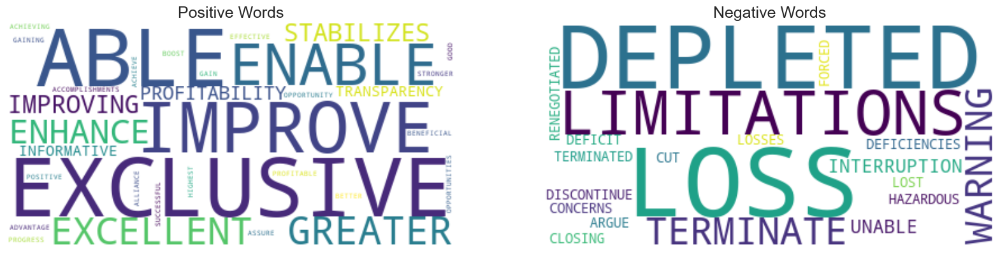

In [ ]:
# filter the dataframe for the year 2011
inis_2011 = inis[inis['year'] == 2011]


# concatenate the lists of positive, negative, and uncertain words for the year
positive_words = ' '.join(inis_2011['words_pos'].explode().dropna())
negative_words = ' '.join(inis_2011['words_neg'].explode().dropna())
uncertain_words = ' '.join(inis_2011['words_unc'].explode().dropna())

# create word clouds for each set of words
wordcloud_positive = WordCloud(background_color='white').generate(positive_words)
wordcloud_negative = WordCloud(background_color='white').generate(negative_words)
wordcloud_uncertain = WordCloud(background_color='white').generate(uncertain_words)

# plot the word clouds
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(wordcloud_positive, interpolation='bilinear')
axs[0].set_title('Positive Words')
axs[0].axis('off')
axs[1].imshow(wordcloud_negative, interpolation='bilinear')
axs[1].set_title('Negative Words')
axs[1].axis('off')
# axs[2].imshow(wordcloud_uncertain, interpolation='bilinear')
# axs[2].set_title('Uncertain Words')
# axs[2].axis('off')
plt.show()

In [ ]:
# %Positive Words in 10-K 2011
int(inis_2011['npos'])/int(inis_2011['nwords'])*100

0.9617311160088158

In [ ]:
# %Negative Words in 10-K 2011
int(inis_2011['nneg'])/int(inis_2011['nwords'])*100

0.721298337006612

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


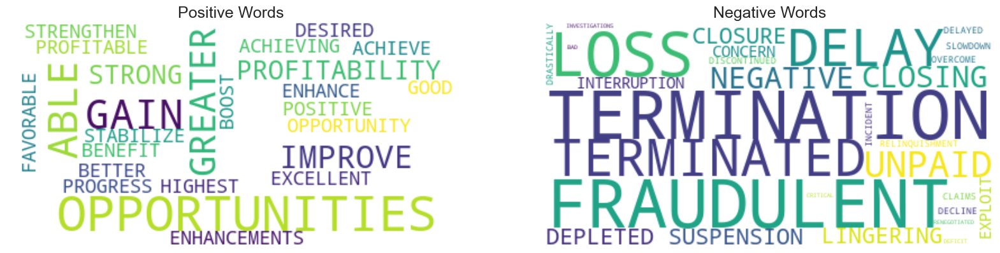

In [ ]:
inis=temp[temp['ticker']=='INIS']
import matplotlib.pyplot as plt
from wordcloud import WordCloud


# filter the dataframe for the year 2022
inis_2022 = inis[inis['year'] == 2022]

# concatenate the lists of positive, negative, and uncertain words for the year
positive_words = ' '.join(inis_2022['words_pos'].explode().dropna())
negative_words = ' '.join(inis_2022['words_neg'].explode().dropna())
uncertain_words = ' '.join(inis_2022['words_unc'].explode().dropna())

# create word clouds for each set of words
wordcloud_positive = WordCloud(background_color='white').generate(positive_words)
wordcloud_negative = WordCloud(background_color='white').generate(negative_words)
wordcloud_uncertain = WordCloud(background_color='white').generate(uncertain_words)

# plot the word clouds
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(wordcloud_positive, interpolation='bilinear')
axs[0].set_title('Positive Words')
axs[0].axis('off')
axs[1].imshow(wordcloud_negative, interpolation='bilinear')
axs[1].set_title('Negative Words')
axs[1].axis('off')
# axs[2].imshow(wordcloud_uncertain, interpolation='bilinear')
# axs[2].set_title('Uncertain Words')
# axs[2].axis('off')
plt.show()

In [ ]:
# %Positive Words in 10-K 2022
int(inis_2022['npos'])/int(inis_2022['nwords'])*100

0.7971506105834464

In [ ]:
# %Negative Words in 10-K 2022
int(inis_2022['nneg'])/int(inis_2022['nwords'])*100

0.8141112618724559

## Topic Modeling

In [ ]:
# Import necessary libraries
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.parsing.preprocessing import preprocess_string

# Preprocess the text in the mda column
texts = [preprocess_string(mda) for mda in inis_2022['mda']]

# Create a dictionary from the preprocessed text
dictionary = corpora.Dictionary(texts)

# Convert the text to a bag-of-words representation
corpus = [dictionary.doc2bow(text) for text in texts]

# Train the LDA model
num_topics = 5
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=10)

# Print the topics and the top words in each topic
for topic in lda_model.print_topics():
    print(topic)

(0, '0.002*"product" + 0.002*"decemb" + 0.002*"increas" + 0.002*"share" + 0.002*"revenu" + 0.002*"promissori" + 0.002*"note" + 0.002*"sale" + 0.002*"stock" + 0.002*"segment"')
(1, '0.002*"note" + 0.002*"sale" + 0.002*"product" + 0.002*"increas" + 0.002*"stock" + 0.002*"revenu" + 0.002*"decemb" + 0.002*"promissori" + 0.002*"nuclear" + 0.002*"expens"')
(2, '0.002*"product" + 0.002*"decemb" + 0.002*"stock" + 0.002*"segment" + 0.002*"revenu" + 0.002*"sale" + 0.002*"share" + 0.002*"prefer" + 0.002*"note" + 0.002*"promissori"')
(3, '0.003*"product" + 0.002*"note" + 0.002*"decemb" + 0.002*"sale" + 0.002*"stock" + 0.002*"promissori" + 0.002*"increas" + 0.002*"year" + 0.002*"compar" + 0.002*"segment"')
(4, '0.024*"product" + 0.017*"note" + 0.016*"sale" + 0.016*"increas" + 0.015*"stock" + 0.014*"share" + 0.014*"decemb" + 0.013*"segment" + 0.013*"revenu" + 0.013*"promissori"')


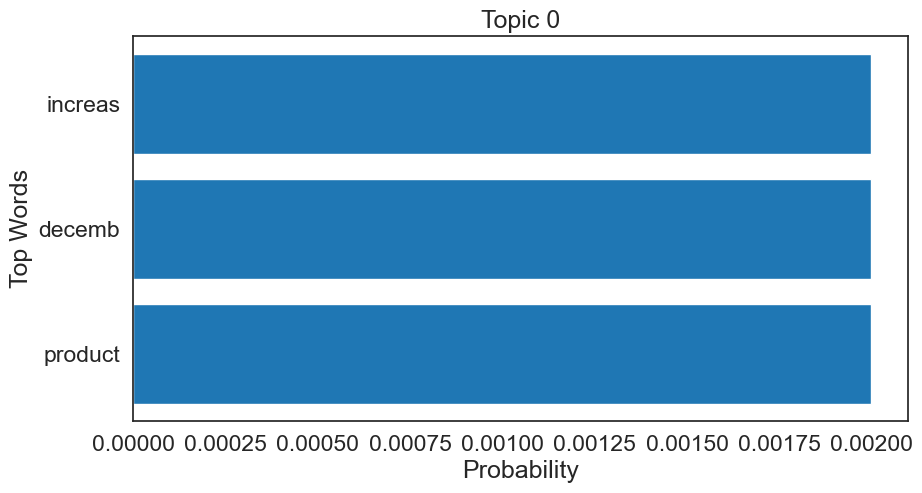

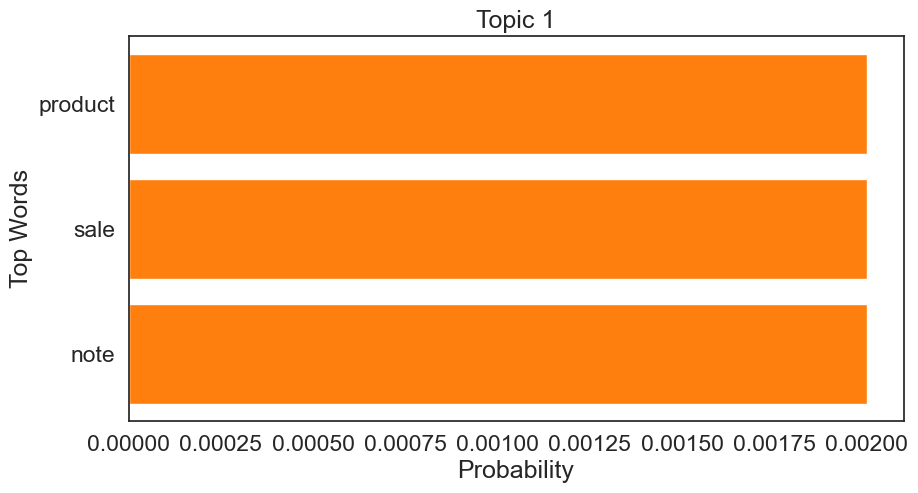

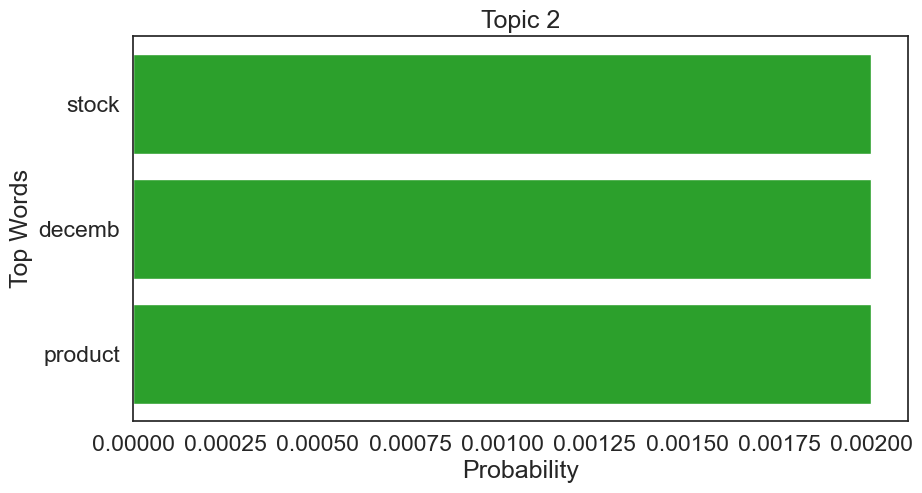

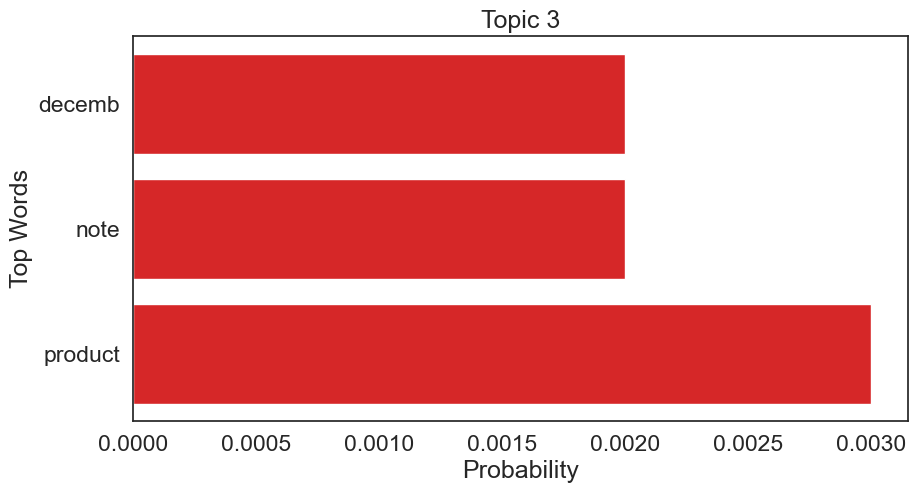

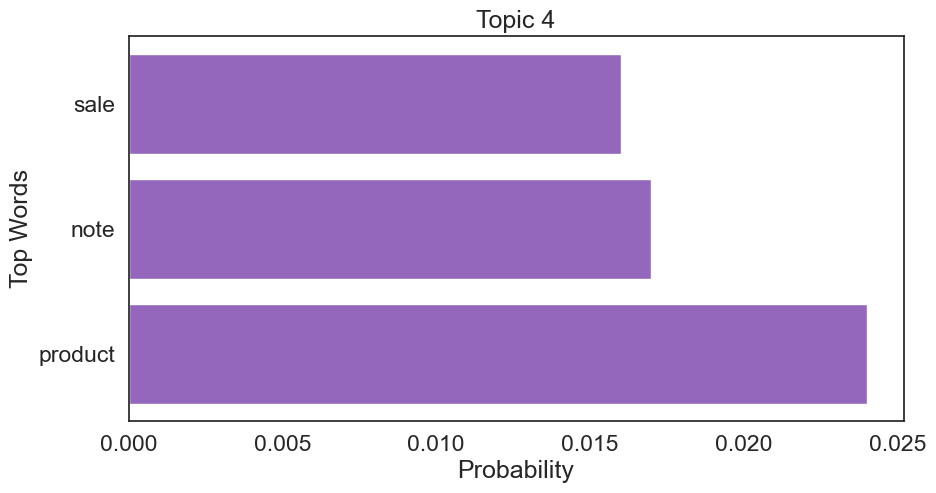

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of top words to display
num_top_words = 3

# Create an array of colors for the bar chart
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

# Loop through each topic and create a bar chart
for i, topic in lda_model.print_topics():
    # Extract the top words and their probabilities for the topic
    top_words = [word.split('*')[1].strip().strip('"') for word in topic.split('+')][:num_top_words]
    top_probs = [float(word.split('*')[0]) for word in topic.split('+')][:num_top_words]
    
    # Create a horizontal bar chart for the top words and their probabilities
    plt.figure(figsize=(10,5))
    plt.barh(range(num_top_words), top_probs, color=colors[i])
    plt.yticks(range(num_top_words), top_words)
    plt.title('Topic {}'.format(i))
    plt.xlabel('Probability')
    plt.ylabel('Top Words')
    plt.show()

In [ ]:
#Combined DataFrame
# Merge residual_income and features_df
merged_df = pd.merge(residual_income, temp, how='left', left_on=['fyear', 'tic'], right_on=['year', 'ticker'])
merged_df.shape

(127147, 35)

In [ ]:
text_vars = ['nwords', 'npos', 'nneg', 'nunc', 'p_pos', 'p_neg', 'p_unc', 'fog_index', 'polarity', 'subjectivity']

extend_df_textual = extend_df.\
        merge(final_text_features, how='left', left_on=['fyear', 'tic'], right_on=['year', 'ticker'])
        
extend_df_textual.dropna(subset=text_vars, inplace=True)

In [ ]:
ri_train_extend_textual, ri_test_extend_textual, ri_2022_extend_textual = clean_df(
    data = extend_df_textual,
    xvars_non_scaled = ['intercept', 'neg_earnings'] + ibes_var + wrds_var + macro_var + text_vars,
    xvars_scaled = ['earnings', 'earnings_interaction', 'book_value', 'tacc'],
    denominator = 'cshom' # normalize by shares outstanding
    ).pipe(train_test_split)

Prediction for T+1 (2020)
ri
Adj R sq: 	 78.41%
Accuracy: 	 0.0149
Bias: 		 0.0149

Coefficients: 
0.0000: 	 intercept
-0.0000: 	 neg_earnings
0.6973: 	 earnings
0.0000: 	 earnings_interaction
-0.1654: 	 book_value
0.0066: 	 tacc
0.0008: 	 nwords
-0.0255: 	 npos
-0.0194: 	 nneg
-0.0447: 	 nunc
326.2863: 	 p_pos
718.9931: 	 p_neg
-74.0780: 	 p_unc
-0.0564: 	 fog_index
42.7491: 	 polarity
-30.0112: 	 subjectivity


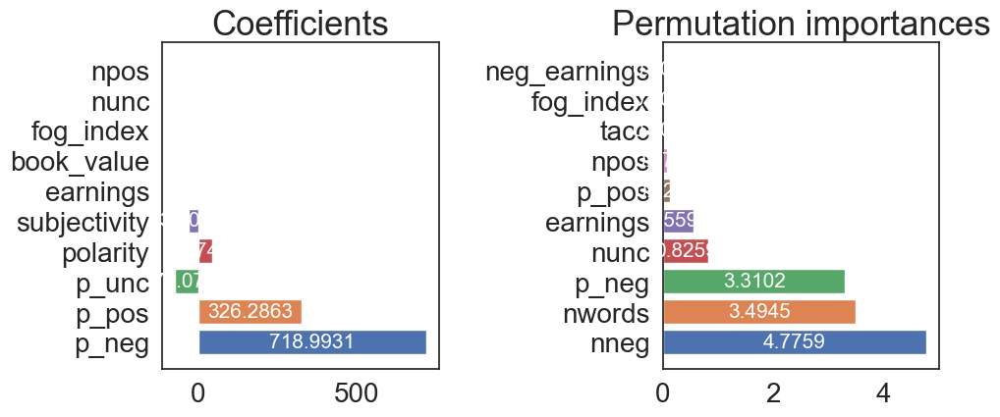

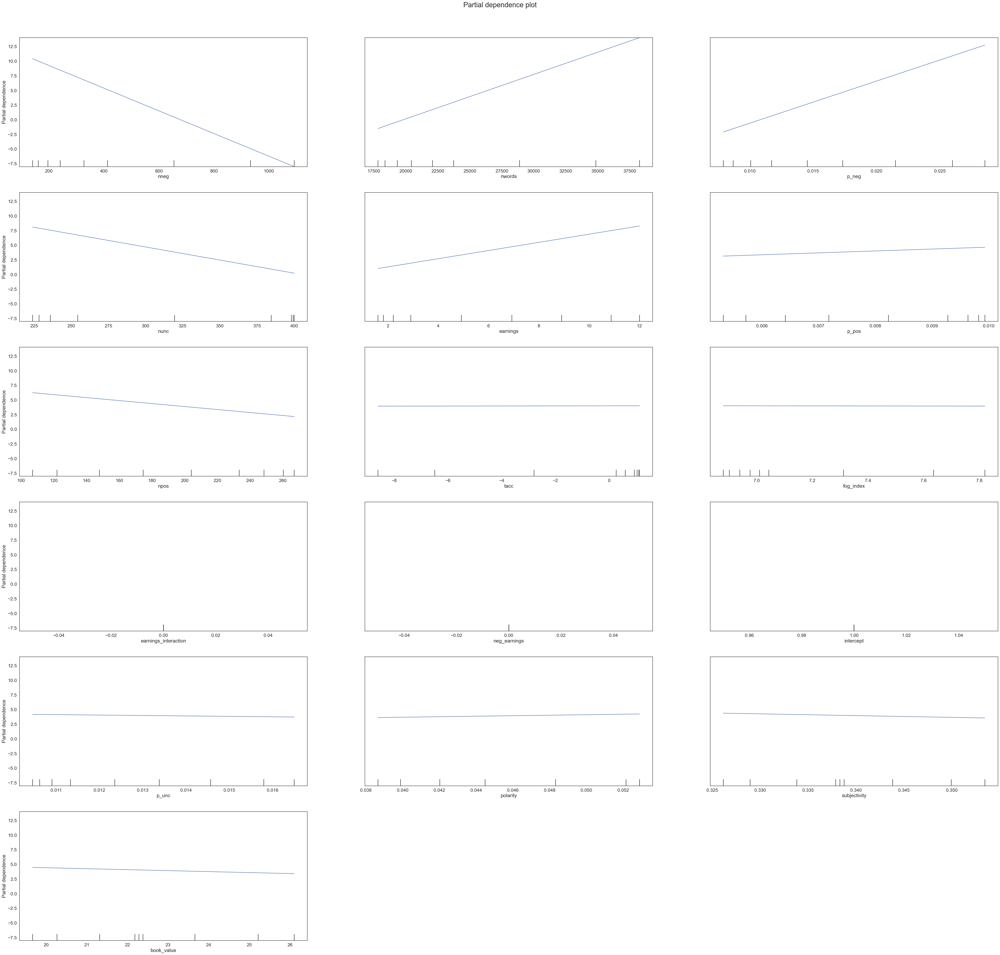

In [ ]:
baseline_performance(
    yvar = 'earnings_lead1',
    params={
        'ri': {
            'train_data': ri_train_extend_textual, 
            'test_data': ri_test_extend_textual,
            'xvars': 
                ri_var + text_vars, # + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    },
    model=LinearRegression(), # too many variables with just 100 rows of data will not be able to fit properly
    plot_var=False,
    plot_inspection=True,
    partial_dependence_figsize=(50,50)
)

#  Comparing performance of 10 firms vs IBES analyst estimates
### Bias & Accuracy

In [ ]:
q3_firms = [
    'AAPL', 'CMTL', 'JNJ', 'KPTI', 'MCD', 'TXRH', 'WMT', 'PSMT', 'CAT', 'ASTE'
]

In [ ]:
# check available firms
db.raw_sql(
    """
    WITH 
    analyst_estimates AS (
        SELECT 
        statpers - fpedats AS days_diff,
        ticker,
        statpers,
        fpedats,
        medest,
        actual,
        DATE_PART('year', fpedats) AS fyear
        FROM ibes.statsum_epsus
        WHERE
            fpi = '1'
            AND
            measure = 'EPS'
            AND 
            statpers <= fpedats
            AND
            DATE_PART('year', fpedats) >= 2020
            AND
            DATE_PART('year', fpedats) <= 2020
    ),
    industry_table AS (
        SELECT 
            gvkey, sic
        FROM comp.company
        WHERE sic = '2834'
    ),
    funda_table AS (
        SELECT gvkey, tic, conm
        FROM comp.funda
        WHERE fyear = 2020
    )
    
    SELECT DISTINCT funda_table.gvkey, funda_table.tic, funda_table.conm, industry_table.sic
    FROM funda_table
    INNER JOIN industry_table
    ON funda_table.gvkey = industry_table.gvkey
    INNER JOIN analyst_estimates
    ON funda_table.tic = analyst_estimates.ticker
    
    """
).merge(ri_test_extend['tic'], how = 'inner', left_on = ['tic'], right_on = ['tic']).drop_duplicates()

,gvkey,tic,conm,sic
0,002086,BAX,BAXTER INTERNATIONAL INC,2834
1,002403,BMY,BRISTOL-MYERS SQUIBB CO,2834
2,006266,JNJ,JOHNSON & JOHNSON,2834
3,006730,LLY,LILLY (ELI) & CO,2834
4,007257,MRK,MERCK & CO,2834
...,...,...,...,...
33,185836,PCRX,PACIRA BIOSCIENCES INC,2834
34,185908,ACRX,ACELRX PHARMACEUTICALS INC,2834
35,186159,SUPN,SUPERNUS PHARMACEUTICALS INC,2834
36,264265,ALNY,ALNYLAM PHARMACEUTICALS INC,2834


In [ ]:
analyst_estimate = db.raw_sql(
    f"""
    WITH 
    analyst_estimates AS (
        SELECT 
        statpers - fpedats AS days_diff,
        ticker,
        statpers,
        fpedats,
        medest,
        actual,
        DATE_PART('year', fpedats) AS fyear
        FROM ibes.statsum_epsus
        WHERE
            fpi = '1'
            AND
            measure = 'EPS'
            AND 
            statpers <= fpedats
            AND
            DATE_PART('year', fpedats) >= 2020
            AND
            DATE_PART('year', fpedats) <= 2020
            AND
            ticker IN ({"'" + "', '".join(q3_firms) + "'"})
    ),
    days_diff_analyst AS (
        SELECT 
        *,
        RANK() OVER (PARTITION BY ticker, fpedats ORDER BY days_diff DESC) AS rank
        FROM analyst_estimates
    )
    SELECT 
        ticker, fyear, medest, statpers
    FROM days_diff_analyst
    WHERE rank = 1
    """
)

analyst_estimate

,ticker,fyear,medest,statpers
0,AAPL,2020.0,3.24,2020-09-17
1,ASTE,2020.0,1.86,2020-12-17
2,CAT,2020.0,5.44,2020-12-17
3,CMTL,2020.0,0.09,2020-07-16
4,JNJ,2020.0,8.01,2020-12-17
5,KPTI,2020.0,-2.79,2020-12-17
6,MCD,2020.0,6.22,2020-12-17
7,PSMT,2020.0,2.50,2020-08-20
8,TXRH,2020.0,0.74,2020-12-17
9,WMT,2020.0,5.00,2020-01-16


In [ ]:
params={
        'ri_extend': {
            'train_data': ri_train_extend, 
            'test_data': ri_test_extend[ri_test_extend.tic.isin(q3_firms)],
            'xvars': 
                ri_var + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    }

earnings_model = 'ri_extend'
model = LGBMRegressor()

xvars = params[earnings_model]['xvars']
train_data = params[earnings_model]['train_data']
test_data = params[earnings_model]['test_data']



# train_data['eps_growth'] = (train_data['earnings_lead1'] - train_data['earnings']) / train_data['earnings'].abs()
yvar = 'earnings_lead1'

model.fit(train_data[xvars], train_data[yvar])

train_prediction = model.predict(train_data[xvars])
test_prediction = model.predict(test_data[xvars])

# adjusted r2 with train data
adj_r2 = adj_r2_func(train_data[yvar], train_prediction, n = train_data.shape[0], p = len(xvars))
print(f"Adj R sq: \t {adj_r2*100:.2f}%")

Adj R sq: 	 88.68%


In [ ]:
test_data[yvar] - analyst_estimate['medest'].values

921      9.2377
2365     4.0014
3032    -4.2710
6762     7.2643
7931    -2.1032
13130    9.4684
14426   -3.4017
26230   -5.7608
66890    1.8173
88282   -4.3510
Name: earnings_lead1, dtype: float64

In [ ]:
q3_analyst_bias = (test_data[yvar] - analyst_estimate['medest'].values) / test_data[params[earnings_model]['performance_scale']].values
q3_analyst_accuracy = q3_analyst_bias.abs()
q3_bias = (test_data[yvar] - test_prediction) / test_data[params[earnings_model]['performance_scale']]
q3_accuracy = q3_bias.abs()
q3_results = pd.DataFrame({
    'model bias': q3_bias.values,
    'analyst bias': q3_analyst_bias.values,
    'model accuracy': q3_accuracy.values,
    'analyst accuracy': q3_analyst_accuracy.values
    
}, index = test_data['tic'].values).reindex(q3_firms).T

q3_results

,AAPL,CMTL,JNJ,KPTI,MCD,TXRH,WMT,PSMT,CAT,ASTE
model bias,-0.0011,-0.0299,-0.0024,0.0385,-0.0130,-0.0385,0.0014,-0.0076,-0.0366,0.0420
analyst bias,0.0467,-0.1519,0.0522,-0.9617,-0.0101,-0.0811,0.0857,0.0355,0.0294,-0.1045
model accuracy,0.0011,0.0299,0.0024,0.0385,0.0130,0.0385,0.0014,0.0076,0.0366,0.0420
analyst accuracy,0.0467,0.1519,0.0522,0.9617,0.0101,0.0811,0.0857,0.0355,0.0294,0.1045


In [ ]:
q3_results.to_csv('q3_results.csv')

# Top 10 firms based on Predicted EPS growth

In [ ]:
_, _, ri_2022_extend = clean_df(
    data = extend_df,
    xvars_non_scaled = ['intercept', 'neg_earnings'] + ibes_var + wrds_var + macro_var,
    xvars_scaled = ['earnings', 'earnings_interaction', 'book_value', 'tacc'],
    denominator = 'cshom', # normalize by shares outstanding
    dropna=False,
    ).pipe(train_test_split)

In [ ]:
params={
        'ri_extend': {
            'train_data': pd.concat([ri_train_extend, ri_test_extend], axis=0), 
            'test_data': ri_2022_extend,
            'xvars': 
                ri_var + ibes_var + wrds_var + macro_var,
            'performance_scale': 'prccm'}
    }

earnings_model = 'ri_extend'
model = LGBMRegressor()

xvars = params[earnings_model]['xvars']
train_data = params[earnings_model]['train_data']
test_data = params[earnings_model]['test_data']



# train_data['eps_growth'] = (train_data['earnings_lead1'] - train_data['earnings']) / train_data['earnings'].abs()
yvar = 'earnings_lead1'

model.fit(train_data[xvars], train_data[yvar])

train_prediction = model.predict(train_data[xvars])
test_prediction = model.predict(test_data[xvars])

# adjusted r2 with train data
adj_r2 = adj_r2_func(train_data[yvar], train_prediction, n = train_data.shape[0], p = len(xvars))
print(f"Adj R sq: \t {adj_r2*100:.2f}%")

Adj R sq: 	 86.41%


In [ ]:
ri_2022_extend['earnings_lead1'] = test_prediction
ri_2022_extend['eps_growth'] = (ri_2022_extend['earnings_lead1'] - ri_2022_extend['earnings']) / ri_2022_extend['earnings'].abs()

# drop na for full records (missing values for ibes and macro anyway)
# add more filters? market cap etc.
top10_firms = ri_2022_extend[
    ri_2022_extend.tic.isin(train_data.tic.unique())
    ].sort_values(by=['eps_growth'], ascending=False).\
    dropna(subset = ['gvkey', 'cik', 'conm', 'tic', 'fyear', 'datadate', 'cshom', 'prccm', 'market_cap'] + [yvar] + ri_var + wrds_var).\
    head(10)

top10_firms[
    ['eps_growth'] + \
    ['gvkey', 'cik', 'conm', 'tic', 'fyear', 'datadate', 'cshom', 'prccm', 'market_cap'] + \
    [yvar] + \
    ri_var + wrds_var
]

,eps_growth,gvkey,cik,conm,tic,fyear,datadate,cshom,prccm,market_cap,earnings_lead1,intercept,neg_earnings,earnings,earnings_interaction,book_value,tacc,accruals,sale_chg,gpm,opm,ptpm,asset_turnover,current_ratio,prod_abnormal
66822,219.549324,065280,0001038277,INTERNATIONAL ISOTOPES INC,INIS,2022.0,2022-12-31,506.289,0.0700,35.440230,0.131993,1,0,0.000598,0.000000,0.008578,-0.000571,-0.874115,0.157317,0.598551,-0.071633,0.027097,0.688335,1.633286,0.287412
45971,44.361940,029089,0001101433,QUOTEMEDIA INC,QMCI,2022.0,2022-12-31,90.478,0.2113,19.118001,0.222603,1,0,0.004907,0.000000,-0.013583,-0.003017,-2.551204,0.155134,0.609083,0.149019,0.025559,2.671137,0.427867,1.044194
39754,40.762423,025937,0000886163,LIGAND PHARMACEUTICAL INC,LGND,2022.0,2022-12-31,16.861,89.2200,1504.338420,0.606832,1,0,0.014531,0.000000,35.435917,-14.777178,0.029493,-0.291874,0.936243,0.395368,0.183500,0.257314,2.667756,0.034804
53606,18.305599,033533,0001704596,EVO PAYMENTS INC,EVOP,2022.0,2022-12-31,47.820,23.5200,1124.726400,0.600738,1,1,-0.034714,-0.034714,-5.189844,5.064283,-0.171209,0.093501,0.835439,0.265472,0.104130,0.218034,1.108549,0.034313
36830,13.681199,024708,0000879585,ATN INTERNATIONAL INC,ATNI,2022.0,2022-12-31,15.745,46.9100,738.597950,0.682183,1,1,-0.053795,-0.053795,36.888727,1.209908,-0.436726,0.204142,0.547144,0.227741,-0.011100,0.424942,0.985024,0.187914
784,12.906911,001613,0000006176,AMPCO-PITTSBURGH CORP,AP,2022.0,2022-12-31,19.191,3.8700,74.269170,0.149527,1,1,-0.012558,-0.012558,5.436194,1.208483,-0.920227,0.131245,0.158339,0.044171,0.014239,0.776072,1.991035,0.586478
31944,12.844430,021834,0001679268,MAMMOTH ENERGY SERVICES INC,TUSK,2022.0,2022-12-31,47.184,2.2000,103.804800,0.155385,1,1,-0.013119,-0.013119,9.804510,-0.169316,-0.662286,0.581424,0.230605,0.121366,0.035870,0.499651,2.093874,0.383715
49486,9.103216,030923,0001681459,TECHNIPFMC PLC,FTI,2022.0,2022-12-31,452.212,6.7300,3043.386760,0.180983,1,1,-0.022335,-0.022335,7.165223,0.284380,-0.703620,0.046365,0.190063,0.088010,0.010283,0.709465,1.195099,0.572144
53426,8.686037,033421,0001726978,GOOSEHEAD INSURANCE,GSHD,2022.0,2022-12-31,20.416,45.6700,932.398720,0.268055,1,0,0.027674,0.000000,0.515478,1.732514,-0.721151,0.383829,0.363422,0.081246,0.024495,0.651589,1.456658,0.414787
75849,7.560355,122202,0001099369,DESTINY MEDIA TECHNOLOGIES,DSNY,2022.0,2022-08-31,10.121,0.6615,6.695042,0.116721,1,0,0.013635,0.000000,0.307282,0.064124,-1.000561,-0.035475,0.836730,0.068588,0.038022,1.128119,5.964989,0.184188


# Feature Importance

In [ ]:
import shap
# compute SHAP values
explainer = shap.explainers.Tree(model, train_data[xvars])
shap_values = explainer(top10_firms[xvars], check_additivity=True)

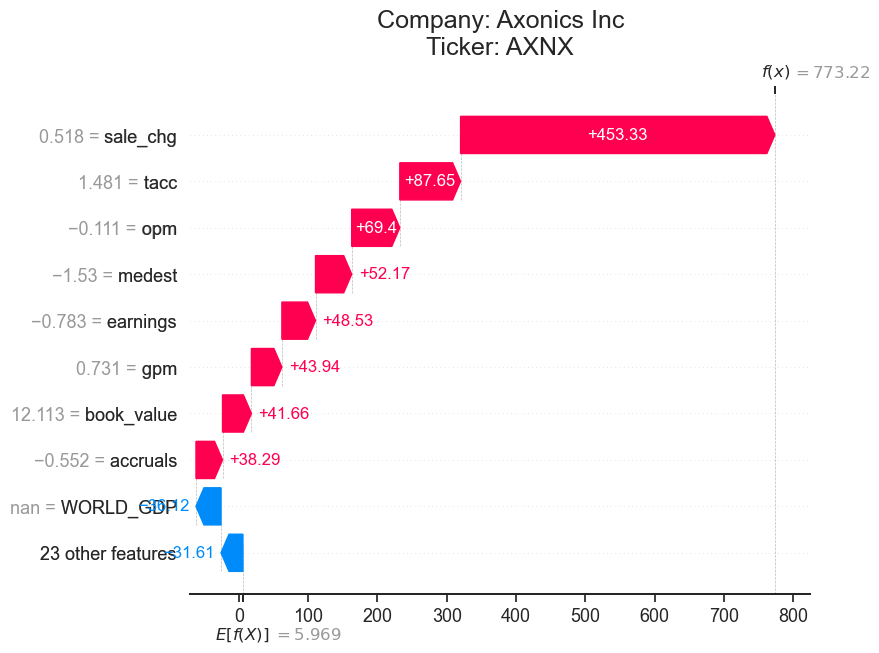

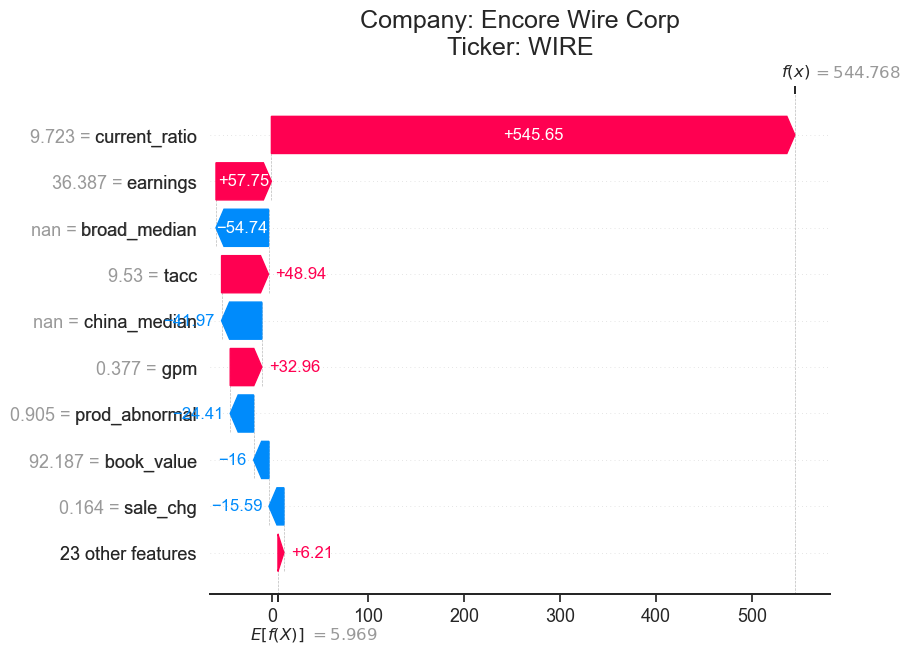

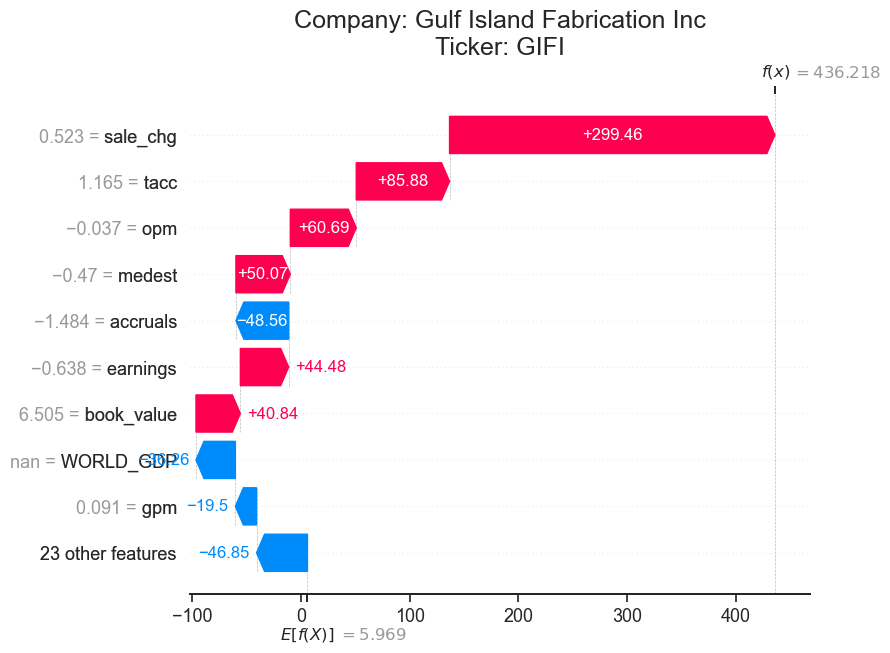

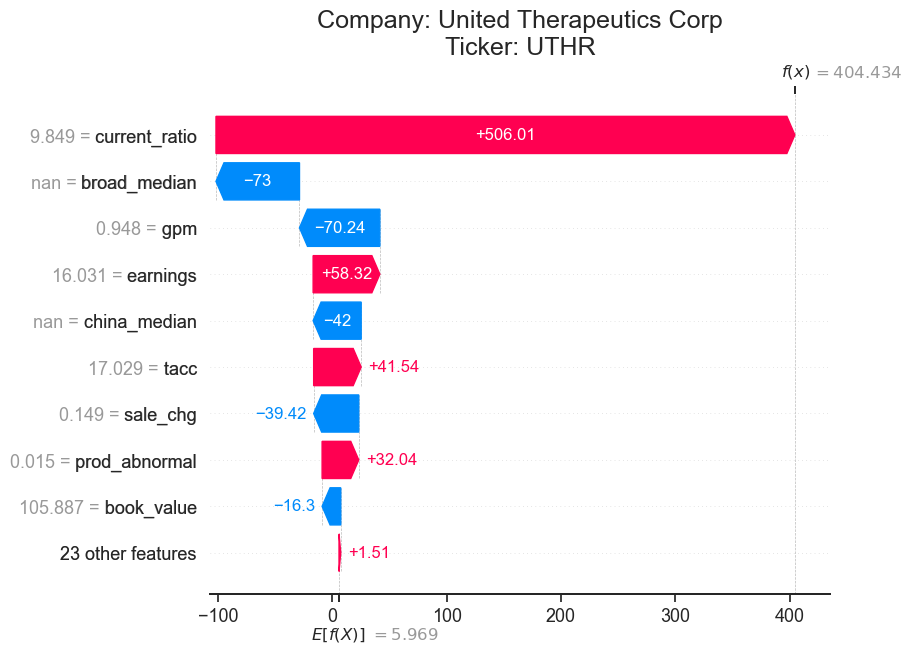

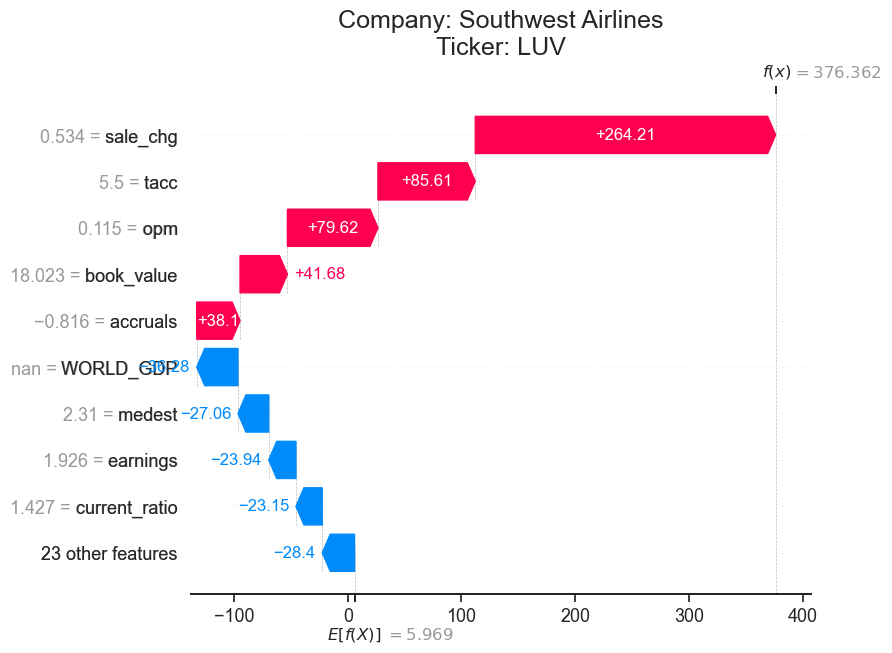

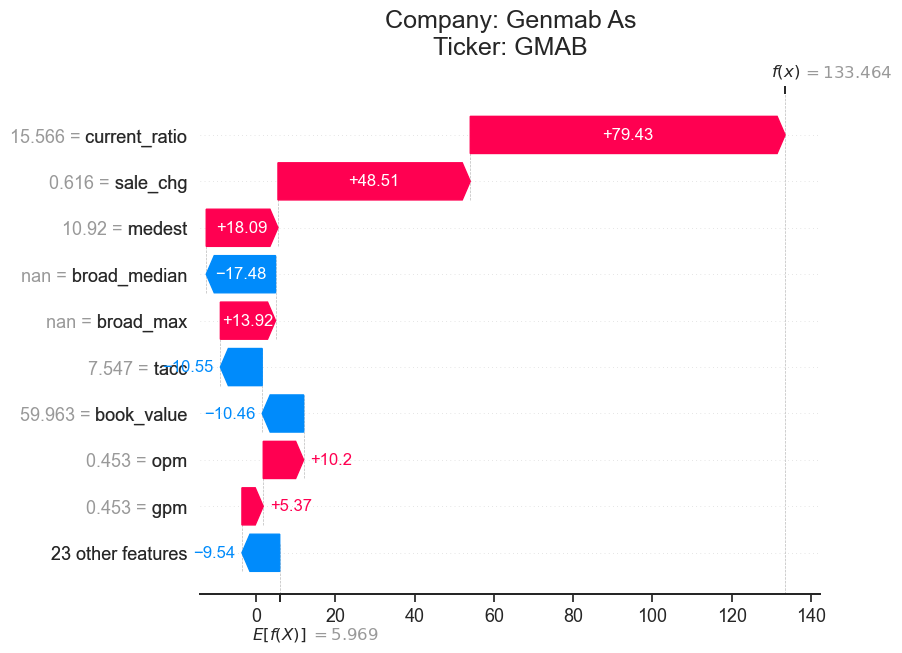

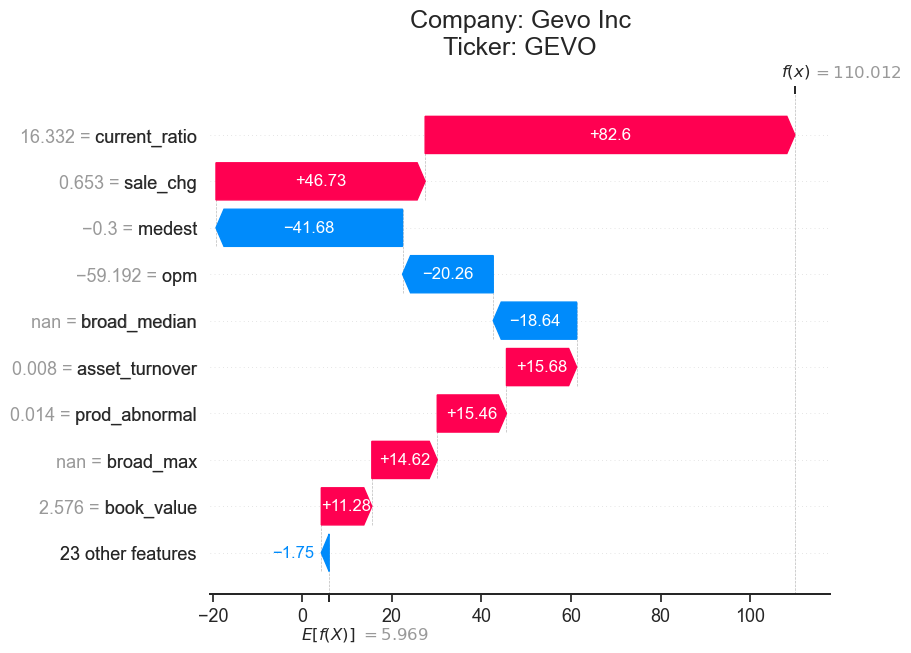

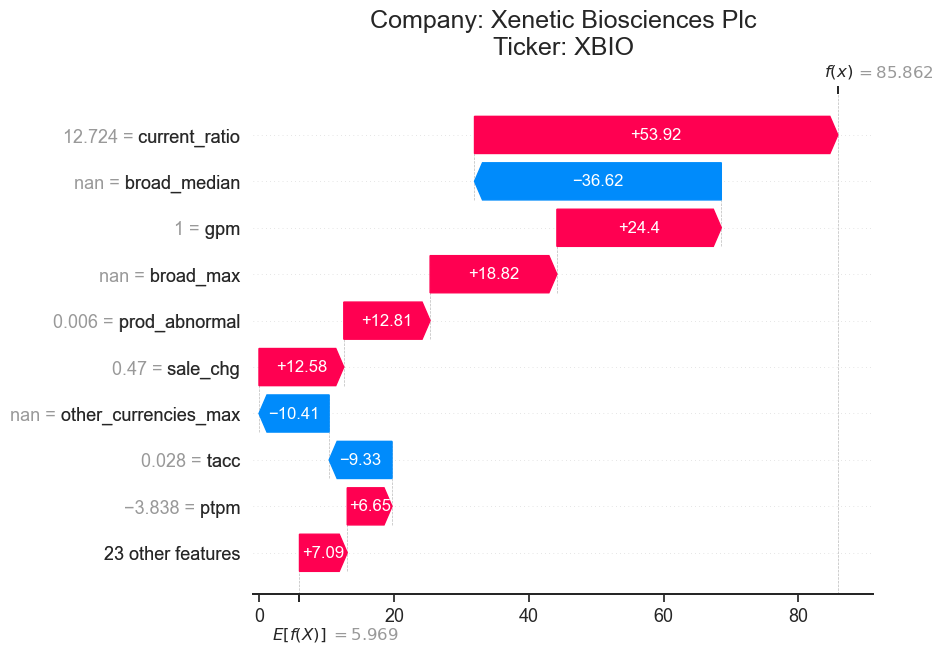

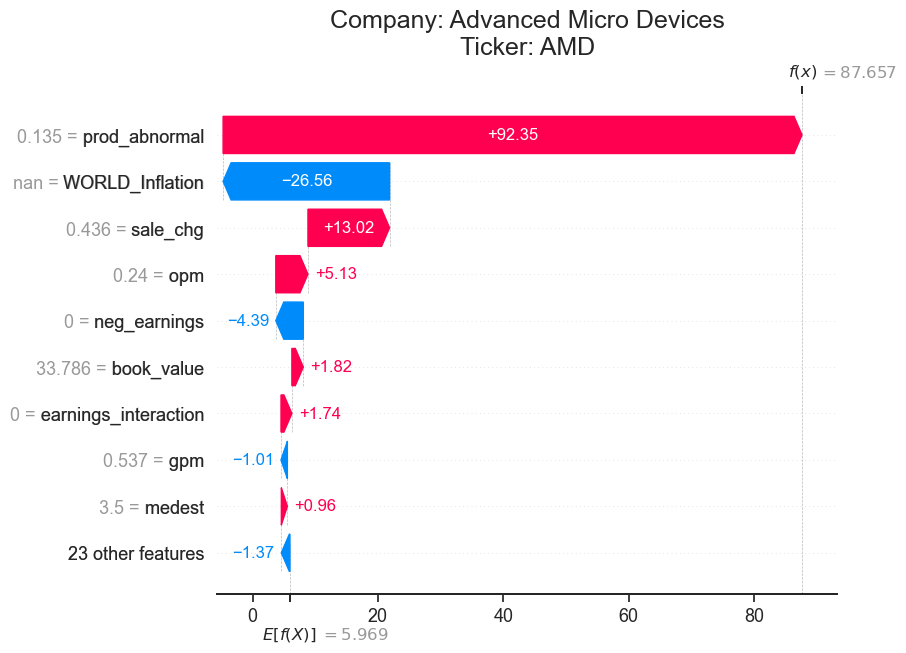

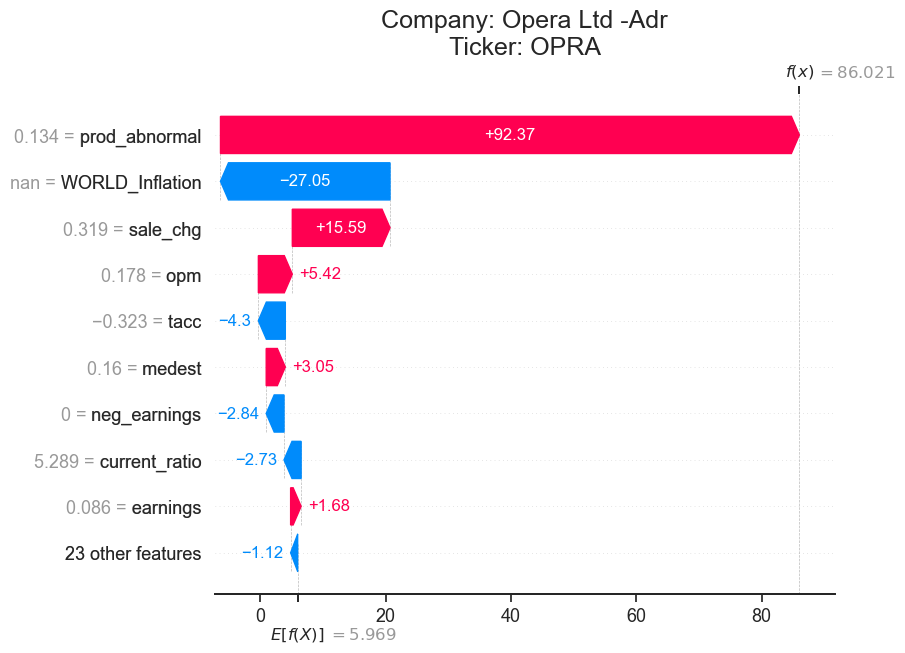

In [ ]:
for i in range(top10_firms.shape[0]):
    plt.title(f'Company: {top10_firms.iloc[i].conm.title()}\nTicker: {top10_firms.iloc[i].tic}')
    shap.plots.waterfall(shap_values[i])
    